# Summarize models

This notebook summarizes all metrics required for model comparison including the following:

  1. Standardized predictor distributions
  1. Model residuals by predictor
  1. Forecast errors overall and by timepoint
  1. Model coefficients averages and by timepoint
  
## Table of contents

 1. [Import and define functions](#Import-and-define-functions)
 1. [Define configuration settings](#Define-configuration-settings)
 1. [Load data](#Load-data)
 1. [Summarize predictors](#Summarize-predictors)
 1. [Summarize model residuals](#Summarize-model-residuals)
 1. [Summarize observed and predicted distances](#Summarize-observed-and-predicted-distances)
 1. [Summarize model forecasting error](#Summarize-model-forecasting-error)

## Import and define functions
[back to top](#Summarize-models)

In [235]:
import Bio.SeqIO
from collections import defaultdict
import glob
import json
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import networkx as nx
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from scipy.stats import linregress
import seaborn as sns

%matplotlib inline

In [236]:
sns.set_style("white")
plt.style.use("huddlej")

In [237]:
mpl.rcParams['savefig.dpi'] = 200
mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['font.weight'] = 300
mpl.rcParams['axes.labelweight'] = 300
mpl.rcParams['font.size'] = 18

In [238]:
!pwd

/Users/jlhudd/projects/nextstrain/flu-forecasting/analyses


In [239]:
def mean_absolute_error(observed, estimated, **kwargs):
    """
    Calculates the mean absolute error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        mean absolute error between observed and estimated values
    """
    return np.mean(np.abs(observed - estimated))

def root_mean_square_error(observed, estimated, **kwargs):
    """
    Calculates the root mean square error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        root mean square error between observed and estimated values
    """
    return np.sqrt(np.mean((observed - estimated) ** 2))

def mean_square_error(observed, estimated, **kwargs):
    """
    Calculates the mean square error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        mean square error between observed and estimated values
    """
    return np.mean((observed - estimated) ** 2)

def facet_time_plot(data, value, value_label, timepoint_column="timepoint", predictors_column="predictors", hue=None,
                    height=4, aspect=1, col_order=None, col_wrap=4, markersize=15):
    g = sns.FacetGrid(data, col=predictors_column, col_order=col_order, col_wrap=col_wrap, hue=hue, height=height, aspect=aspect)
    g.map_dataframe(sns.lineplot, x=timepoint_column, y=value, estimator="mean", ci="sd", markers=True, dashes=False,
                   style=predictors_column, markersize=markersize)
    g.set_axis_labels("Date", value_label)

    for ax in g.axes.flatten():
        ax.axhline(y=0, color="#cccccc", zorder=-10)

        #start, end = [int(value) for value in ax.get_xlim()]
        #end = end + 1
        #stepsize = 2.0
        #ax.xaxis.set_ticks(np.arange(start, end, stepsize))

        #labels = ax.get_xticklabels()
        #output = plt.setp(labels, rotation=30)
        
    plt.gcf().autofmt_xdate()
    return g

## Define configuration settings
[back to top](#Summarize-models)

In [240]:
predictor_names_order = [
    "naive",
    "delta_frequency",
    "lbi",
    "ep",
    "ep_star",
    "ep_x",
    "ep_luksza_x",
    "cTiterSub",
    "cTiterSub_star",
    "cTiterSub_x",
    "ne_star",
    "dms",
    "dms_star",
    "lbi-cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

In [241]:
"""
predictor_names_order = [
    "naive",
    "delta_frequency",
    "lbi",
    "ep_x",
    "cTiterSub_x",
    "ne_star",
    "dms_star"
]
"""

predictor_names_order = [
    "naive",
    "ep",
    "ep_star",
    "ep_x",
    "ne",
    "ne_star",
    "lbi",
    "dms",
    "dms_star",
    "delta_frequency"
]

minimal_predictor_names_order = [
    "naive",
    "ep",
    "ne",
    "lbi",
    "lbi-ep-ne"
]

In [242]:
data_root = "../results/builds/h3n2/90_viruses_per_month/sample_0/2000-10-01--2015-10-01/"
data_root = "../results/builds/h3n2/1_viruses_per_month/sample_0/2000-10-01--2015-10-01/"
data_root = "../results/builds/h3n2/5_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

data_root = "../results/builds/h3n2/10_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

data_root = "../results/builds/simulations/100/2000-10-01--2100-10-01/"
#data_root = "../results/builds/simulations/20/2000-10-01--2100-10-01/"
#data_root = "../results/builds/h3n2/30_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

data_root = "../results/builds/simulations/100/2010-10-01--2030-10-01/"

## Load data
[back to top](#Summarize-models)

In [243]:
tip_attributes_df = pd.read_table(data_root + "tip_attributes_with_weighted_distances.tsv", parse_dates=["timepoint"])

In [244]:
observed_weighted_distances = tip_attributes_df.loc[:, ["timepoint", "strain", "frequency", "weighted_distance_to_future"]].copy()

In [245]:
observed_weighted_distances["y"] = (1 - observed_weighted_distances["frequency"]) * observed_weighted_distances["weighted_distance_to_future"]

In [246]:
model_jsons = glob.glob(data_root + "models_by_distances/*.json")

In [247]:
models_by_predictors = {}

for model_json in model_jsons:
    with open(model_json, "r") as fh:
        data = json.load(fh)
        models_by_predictors["-".join(data["predictors"])] = data

In [248]:
models_by_predictors["lbi"]["cost_function"]

'diffsum'

In [249]:
models_by_predictors["lbi"]["l1_lambda"]

0.0

In [250]:
models_by_predictors["lbi"]["training_window"]

6

In [251]:
models_by_predictors["lbi"]["pseudocount"]

In [252]:
type(models_by_predictors["lbi"])

dict

In [253]:
sorted(models_by_predictors.keys())

['delta_frequency',
 'dms',
 'dms_star',
 'ep',
 'ep-ne',
 'ep_star',
 'ep_x',
 'ep_x-ne_star',
 'lbi',
 'lbi-ep-ne',
 'naive',
 'ne',
 'ne_star']

In [254]:
models_by_predictors["lbi"].keys()

dict_keys(['scores', 'predictors', 'cv_error_mean', 'cv_error_std', 'coefficients_mean', 'coefficients_std', 'mean_stds_mean', 'mean_stds_std', 'cost_function', 'l1_lambda', 'delta_months', 'training_window', 'pseudocount'])

In [255]:
models_by_predictors["lbi"]["scores"][0].keys()

dict_keys(['predictors', 'training_data', 'training_n', 'training_error', 'coefficients', 'mean_stds', 'validation_data', 'validation_n', 'validation_error', 'last_training_timepoint', 'validation_timepoint'])

In [256]:
models_by_predictors["lbi"]["scores"][0]["training_n"]

814

In [257]:
models_by_predictors["lbi"]["scores"][0]["validation_data"].keys()

dict_keys(['X', 'y', 'y_hat'])

In [258]:
models_by_predictors["lbi"]["scores"][0]["coefficients"]

[1.4595594269518477]

In [259]:
models_by_predictors["lbi"]["scores"][0]["mean_stds"]

[0.07789298818249982]

In [260]:
len(models_by_predictors["lbi"]["scores"])

23

Build data frames for plotting from the model scores.

In [261]:
overall_errors = []
errors_by_time = []
overall_coefficients = []
coefficients_by_time = []
mean_stds_by_time = []
frequency_dfs = []
residuals_dfs = []

for predictors, model in models_by_predictors.items():
    overall_errors.append({
        "predictors": predictors,
        "cv_error_mean": model["cv_error_mean"],
        "cv_error_std": model["cv_error_std"]
    })

    for predictor, mean, std in zip(model["predictors"], model["coefficients_mean"], model["coefficients_std"]):
        overall_coefficients.append({
            "predictors": predictors,
            "predictor": predictor,
            "mean": mean,
            "std": std
        })
    
    for scores in model["scores"]:
        errors_by_time.append({
            "predictors": predictors,
            "validation_timepoint": scores["validation_timepoint"],
            "validation_error": scores["validation_error"],
            "validation_n": scores["validation_n"]
        })
        
        for predictor, coefficient, mean_std in zip(model["predictors"], scores["coefficients"], scores["mean_stds"]):
            coefficients_by_time.append({
                "predictors": predictors,
                "predictor": predictor,
                "coefficient": coefficient,
                "validation_timepoint": scores["validation_timepoint"]
            })
            
            mean_stds_by_time.append({
                "predictors": predictors,
                "predictor": predictor,
                "mean_std": mean_std,
                "validation_timepoint": scores["validation_timepoint"]
            })
        
        X = pd.DataFrame(scores["validation_data"]["X"])
        X["timepoint"] = pd.to_datetime(X["timepoint"])

        y = pd.DataFrame(scores["validation_data"]["y"])
        y["timepoint"] = pd.to_datetime(y["timepoint"])
        y["future_timepoint"] = pd.to_datetime(y["future_timepoint"])

        y_hat = pd.DataFrame(scores["validation_data"]["y_hat"])
        y_hat["timepoint"] = pd.to_datetime(y_hat["timepoint"])

        frequency_df = y_hat.merge(
            observed_weighted_distances,
            on=["timepoint", "strain", "frequency"],
            suffixes=["_hat", ""]
        )
        frequency_df["residual"] = frequency_df["y"] - frequency_df["y_hat"]
        frequency_df["validation_timepoint"] = pd.to_datetime(scores["validation_timepoint"])
        frequency_df["predictors"] = predictors
        frequency_dfs.append(frequency_df)

        training_X = pd.DataFrame(scores["training_data"]["X"])
        training_X["timepoint"] = pd.to_datetime(training_X["timepoint"])

        training_y = pd.DataFrame(scores["training_data"]["y"])
        training_y["timepoint"] = pd.to_datetime(training_y["timepoint"])
        training_y_hat = pd.DataFrame(scores["training_data"]["y_hat"])
        training_y_hat["timepoint"] = pd.to_datetime(training_y_hat["timepoint"])
        residual_df = training_y_hat.merge(
            observed_weighted_distances,
            on=["timepoint", "strain", "frequency"],
            suffixes=["_hat", ""]
        )
        residual_df["residual"] = residual_df["y"] - residual_df["y_hat"]
        residual_df["validation_timepoint"] = pd.to_datetime(scores["validation_timepoint"])
        residual_df["predictors"] = predictors

        residuals_dfs.append(residual_df)
        
overall_errors_df = pd.DataFrame(overall_errors)
errors_by_time_df = pd.DataFrame(errors_by_time)
overall_coefficients_df = pd.DataFrame(overall_coefficients)
coefficients_by_time_df = pd.DataFrame(coefficients_by_time)
mean_stds_by_time_df = pd.DataFrame(mean_stds_by_time)
frequency_df = pd.concat(frequency_dfs, ignore_index=True)
residual_df = pd.concat(residuals_dfs, ignore_index=True)

In [262]:
frequency_df.head()

,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
0,0.000001,2.507759e-06,sample_1792_10,2018-10-01,7.047159,11.774114,14.119174,7.047159,7.047152,-7.072022,2018-10-01,dms_star
1,0.000001,2.820135e-07,sample_1792_11,2018-10-01,30.602606,24.889538,25.340839,30.602606,30.602575,5.261737,2018-10-01,dms_star
2,0.000001,3.760918e-07,sample_1792_12,2018-10-01,18.585327,15.865344,18.744255,18.585327,18.585308,-0.158946,2018-10-01,dms_star
3,0.000001,6.953194e-07,sample_1792_13,2018-10-01,30.510195,24.710970,25.207578,30.510195,30.510164,5.302586,2018-10-01,dms_star
4,0.000001,2.507759e-06,sample_1792_15,2018-10-01,27.554709,21.728564,22.229359,27.554709,27.554681,5.325323,2018-10-01,dms_star


In [263]:
residual_df.head()

,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
0,0.000004,3.859914e-06,sample_1096_19,2011-10-01,11.503066,13.288652,10.506889,11.503066,11.503020,0.996131,2018-10-01,dms_star
1,0.000004,2.010486e-07,sample_1096_2,2011-10-01,35.548871,30.950545,31.547553,35.548871,35.548729,4.001176,2018-10-01,dms_star
2,0.000004,5.806058e-07,sample_1096_3,2011-10-01,32.674682,27.889180,28.794959,32.674682,32.674551,3.879592,2018-10-01,dms_star
3,0.000004,3.259761e-07,sample_1096_6,2011-10-01,14.343651,16.211539,13.473197,14.343651,14.343594,0.870396,2018-10-01,dms_star
4,0.000104,2.701999e-04,sample_1104_11,2011-10-01,12.493710,14.061259,11.188404,12.493710,12.492411,1.304007,2018-10-01,dms_star


In [264]:
residual_df.shape

(394654, 12)

In [265]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint
0,dms_star,18.827129,110,2018-10-01
1,dms_star,10.670622,90,2019-04-01
2,dms_star,8.983658,96,2019-10-01
3,dms_star,10.927245,110,2020-04-01
4,dms_star,9.984572,110,2020-10-01


In [266]:
overall_errors_df.sort_values("cv_error_mean")

,cv_error_mean,cv_error_std,predictors
7,9.711079,2.464244,lbi-ep-ne
3,10.793953,2.683056,lbi
6,11.059694,2.033005,ep_x-ne_star
8,11.083023,2.284550,delta_frequency
4,11.226754,1.980274,ne_star
10,11.325694,2.261996,ne
5,11.476441,2.439716,ep-ne
0,12.204476,2.711837,dms_star
9,12.323900,2.385489,ep_star
1,12.386236,3.088195,dms


## Summarize predictors
[back to top](#Summarize-models)

In [166]:
individual_predictor_names_order = [
    predictor
    for predictor in predictor_names_order
    if not "-" in predictor and predictor != "naive"
]

In [167]:
long_predictors_df = tip_attributes_df.melt(
    id_vars=["strain", "timepoint"],
    value_vars=individual_predictor_names_order,
    var_name="predictor",
    value_name="predictor_value"
)

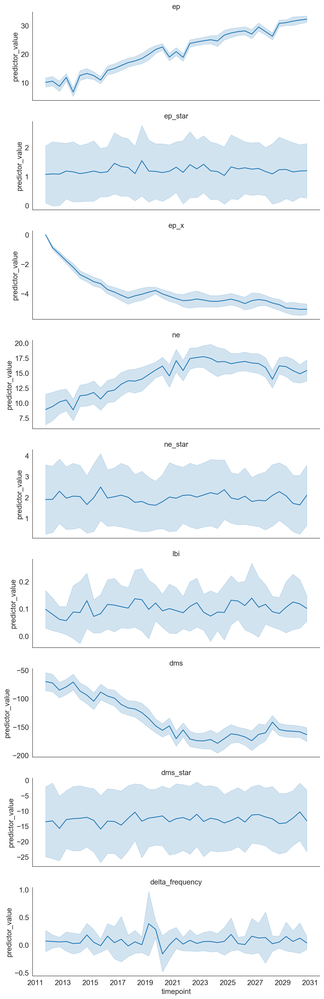

In [168]:
g = sns.FacetGrid(long_predictors_df, row="predictor", aspect=3, sharey=False)
g.map(sns.lineplot, "timepoint", "predictor_value", ci="sd")
g.set_titles("{row_name}")

plt.savefig("../manuscript/figures/predictors_by_timepoint.pdf")

In [169]:
mean_stds_by_time_df.head()

,mean_std,predictor,predictors,validation_timepoint
0,10.635542,dms_star,dms_star,2018-10-01
1,10.470683,dms_star,dms_star,2019-04-01
2,10.438751,dms_star,dms_star,2019-10-01
3,10.349569,dms_star,dms_star,2020-04-01
4,10.327194,dms_star,dms_star,2020-10-01


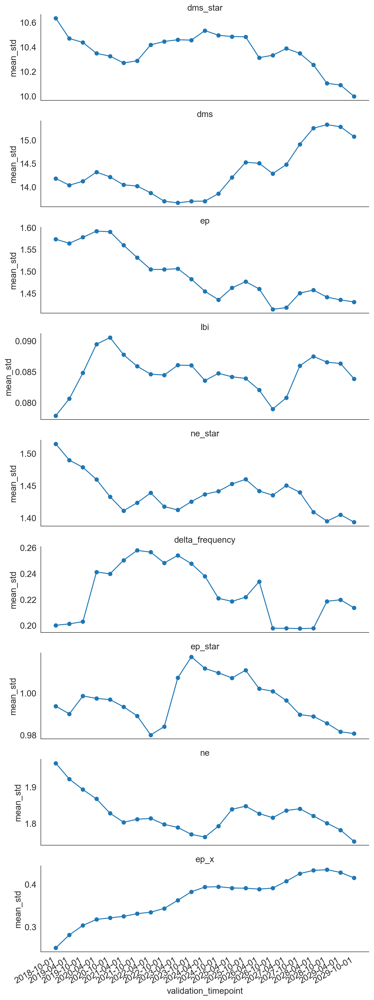

In [173]:
g = sns.FacetGrid(
    mean_stds_by_time_df[mean_stds_by_time_df["predictors"].isin(individual_predictor_names_order)],
    row="predictor",
    aspect=3,
    sharey=False
)
g.map(plt.plot, "validation_timepoint", "mean_std", marker="o")
g.set_titles("{row_name}")

plt.gcf().autofmt_xdate()

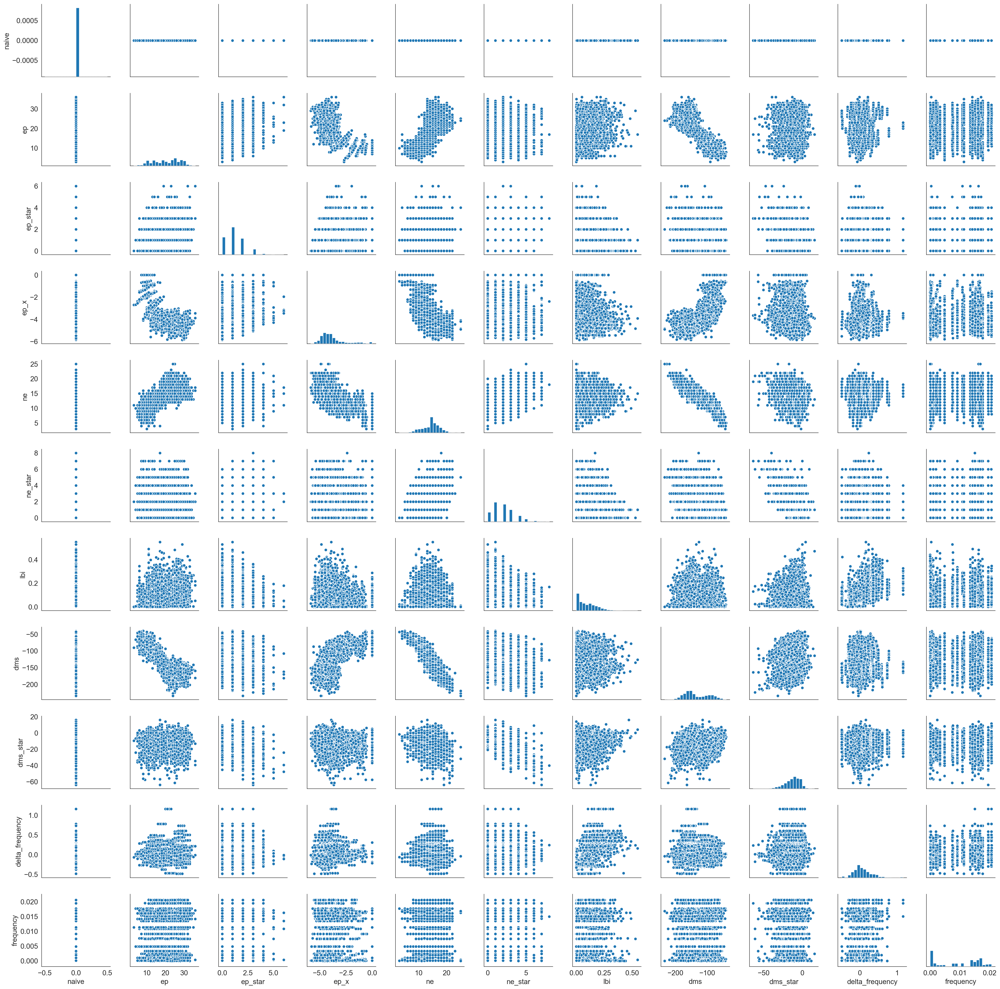

In [70]:
variables_to_plot = [predictor for predictor in predictor_names_order if not "-" in predictor] + ["frequency"]
sns.pairplot(tip_attributes_df.dropna(), vars=variables_to_plot, diag_kind="hist", diag_kws={"bins": 20})

## Summarize model residuals
[back to top](#Summarize-models)

In [75]:
residuals_by_timepoint = residual_df.groupby(["predictors", "timepoint"])["residual"].sum().reset_index()

In [76]:
residuals_by_timepoint.head()

,predictors,timepoint,residual
0,delta_frequency,2011-10-01,141.744344
1,delta_frequency,2012-04-01,70.993448
2,delta_frequency,2012-10-01,523.642609
3,delta_frequency,2013-04-01,294.110916
4,delta_frequency,2013-10-01,894.974824


In [80]:
max_lags = 18

### Residuals by predictor

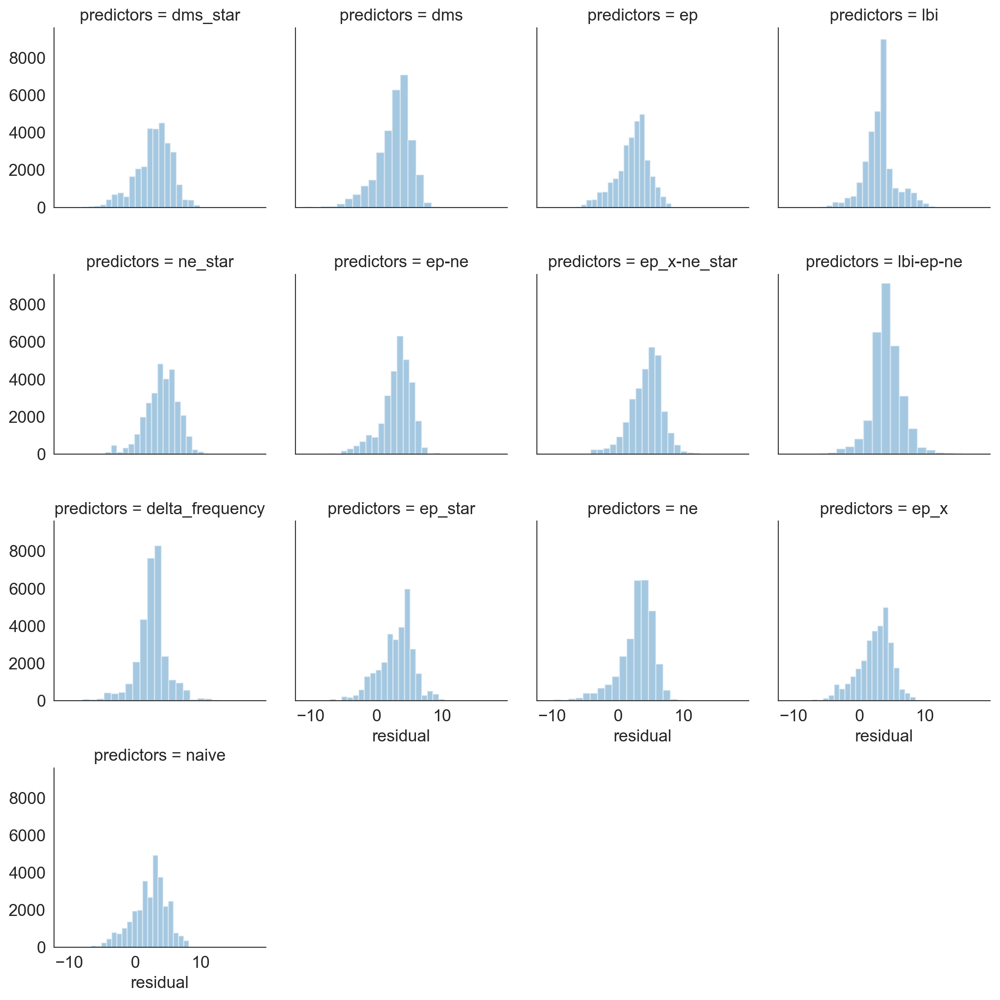

In [174]:
g = sns.FacetGrid(residual_df, col="predictors", col_wrap=4)
g.map(sns.distplot, "residual", bins=20, kde=False)

In [175]:
residual_df.groupby("predictors")["residual"].median().sort_values()

predictors
ep                 2.580581
naive              2.661936
delta_frequency    2.730795
ep_x               2.738320
dms_star           3.091508
dms                3.173751
lbi                3.238258
ne                 3.251765
ep_star            3.458272
ep-ne              3.480341
lbi-ep-ne          4.070698
ne_star            4.175900
ep_x-ne_star       4.637677
Name: residual, dtype: float64

In [176]:
residual_df.groupby("predictors")["residual"].count()

predictors
delta_frequency    30358
dms                30358
dms_star           30358
ep                 30358
ep-ne              30358
ep_star            30358
ep_x               30358
ep_x-ne_star       30358
lbi                30358
lbi-ep-ne          30358
naive              30358
ne                 30358
ne_star            30358
Name: residual, dtype: int64

In [177]:
(residual_df["residual"] < -0.01).sum()

47747

### Residuals by timepoint

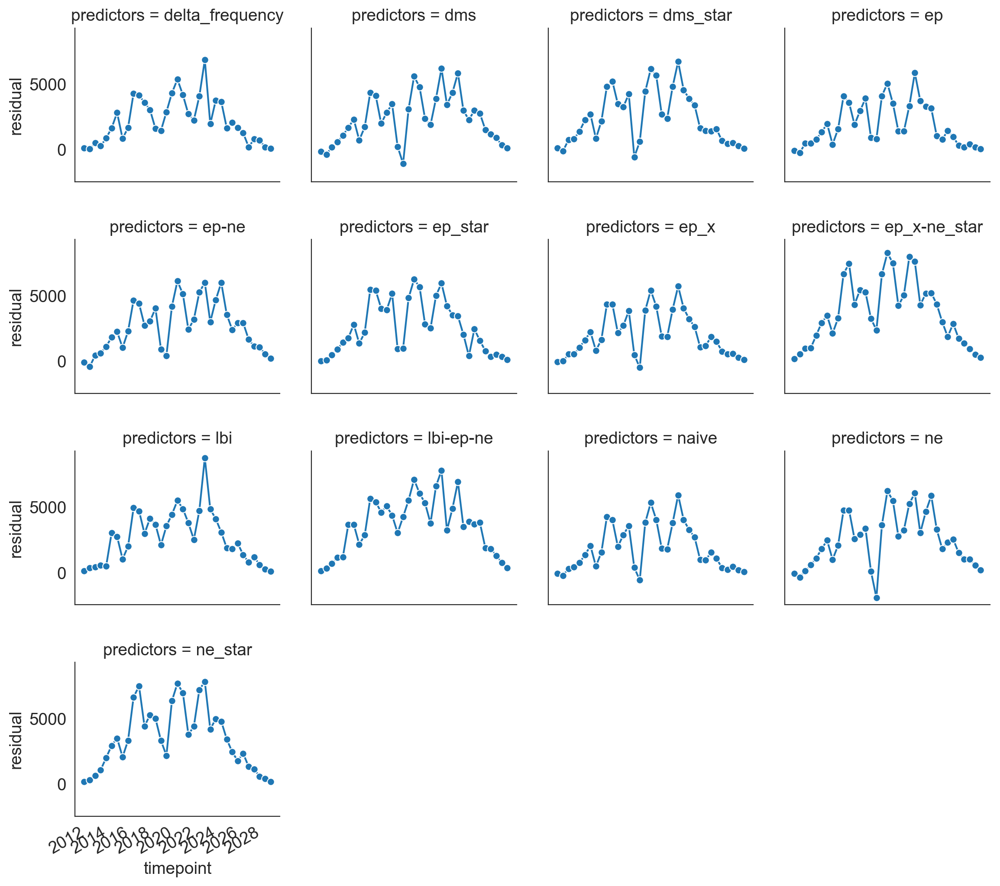

In [178]:
g = sns.FacetGrid(residuals_by_timepoint, col="predictors", col_wrap=4)
g.map(sns.lineplot, "timepoint", "residual", marker="o", linestyle="")
plt.gcf().autofmt_xdate()

In [179]:
np.abs(residuals_by_timepoint[residuals_by_timepoint["predictors"] == "lbi"]["residual"].values - residuals_by_timepoint[residuals_by_timepoint["predictors"] == "naive"]["residual"].values)

array([ 205.45218859,  586.72171794,  116.3122657 ,  105.24089398,
        261.74230582, 1696.28389312,  692.52731938,  555.2922733 ,
        446.95895134,  672.68396452,  685.98582344,  998.16225809,
       1263.0893111 ,  102.65438041, 1728.32305452, 4124.35538537,
        621.76242672,  164.85280843,  826.25351255, 1939.37836688,
        726.54108252,  929.4537311 , 2829.49221446,  803.76038615,
        836.39993349,  377.18403626,  868.20631335,  879.66149274,
        694.53977072,  266.79347066,  436.77235608,  975.77248829,
        152.72772865,   51.99394214,   49.3825973 ])

### Autocorrelation of residuals

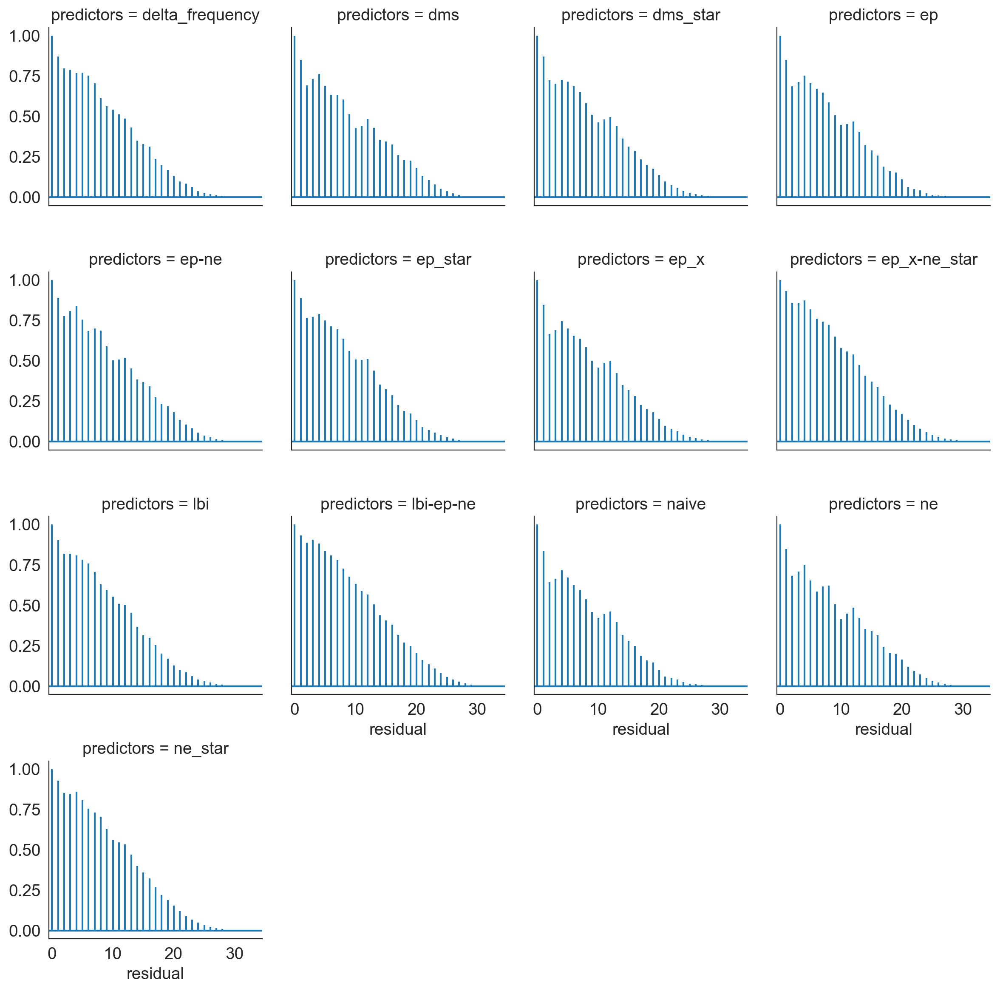

In [180]:
g = sns.FacetGrid(residuals_by_timepoint, col="predictors", col_wrap=4)
g.map(plt.acorr, "residual", maxlags=max_lags)

for ax in g.axes.flatten():
    ax.set_xlim(-0.5, max_lags + 0.5)

## Summarize observed and predicted distances
[back to top](#Summarize-models)

$$
d_{i}(x(t)) = \sum_{j}x_{j}d_{ij}
$$

$$
u = t + \Delta{t}
$$

$$
\hat{x}_{i}(t, u) = x_{i}(t)e^{(f_{i}(t)(u - t))}
$$

$$
y = x_{i}(t)d_{i}(x(u))
$$

$$
\hat{y} = x_{i}(t)d_{i}(\hat{x}(t, u))
$$

$$
D(x(t), x(u)) = \sum_{i}x_{i}d_{i}(u)
$$

$$
D(\hat{x}(t, u), x(u)) = \sum_{i}x_{i}e^{(f_{i}(t)(u - t))}d_{i}(u)
$$

$$
L = \sum_{t}D(\hat{x}(t, u), x(u))
$$

In [181]:
frequency_df["observed_rank"] = frequency_df["y"] # / frequency_df["frequency"]
frequency_df["estimated_rank"] = frequency_df["y_hat"] # / frequency_df["frequency"]

In [182]:
data_to_plot = frequency_df[frequency_df["predictors"] == "lbi"]

In [183]:
minimum_observed_distance = data_to_plot.groupby("validation_timepoint")["observed_rank"].min().reset_index()

In [184]:
minimum_estimated_distance = data_to_plot.groupby("validation_timepoint")["estimated_rank"].min().reset_index()

Text(0.35,0.75,'mean = 15.89')

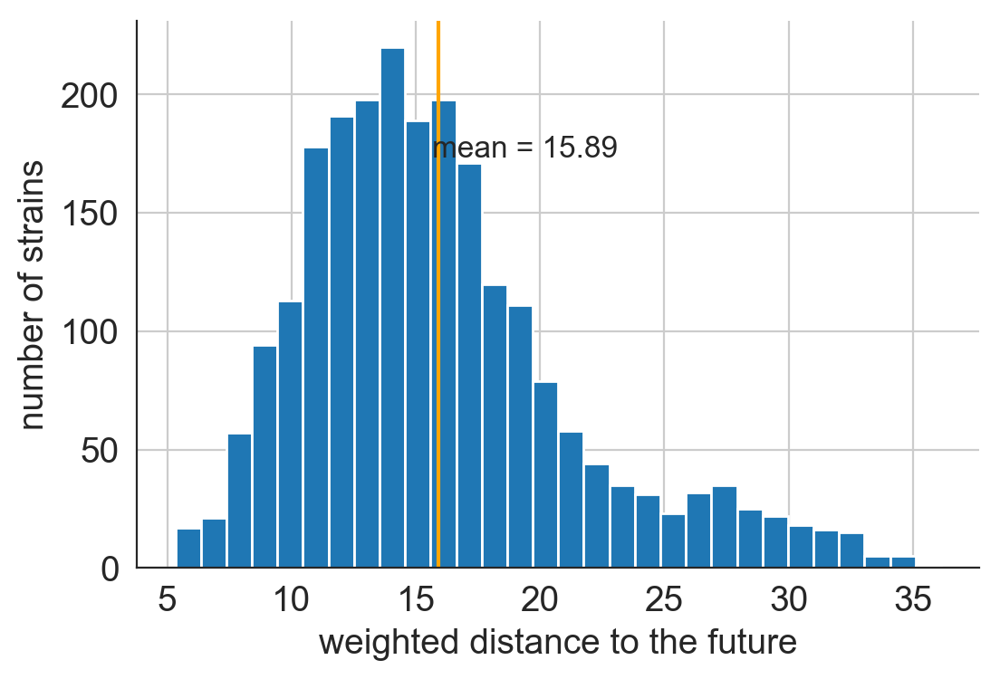

In [93]:
ax = frequency_df[frequency_df["predictors"] == "naive"]["y"].hist(bins=30)
ax.set_xlabel("weighted distance to the future")
ax.set_ylabel("number of strains")

mean_y = frequency_df[frequency_df["predictors"] == "naive"]["y"].mean()
ax.axvline(
    x=mean_y,
    color="orange"
)

ax.text(
    0.35,
    0.75,
    "mean = %.2f" % (mean_y,),
    transform=ax.transAxes,
    fontsize=12
)


Text(0.35,0.75,'mean = 12.58')

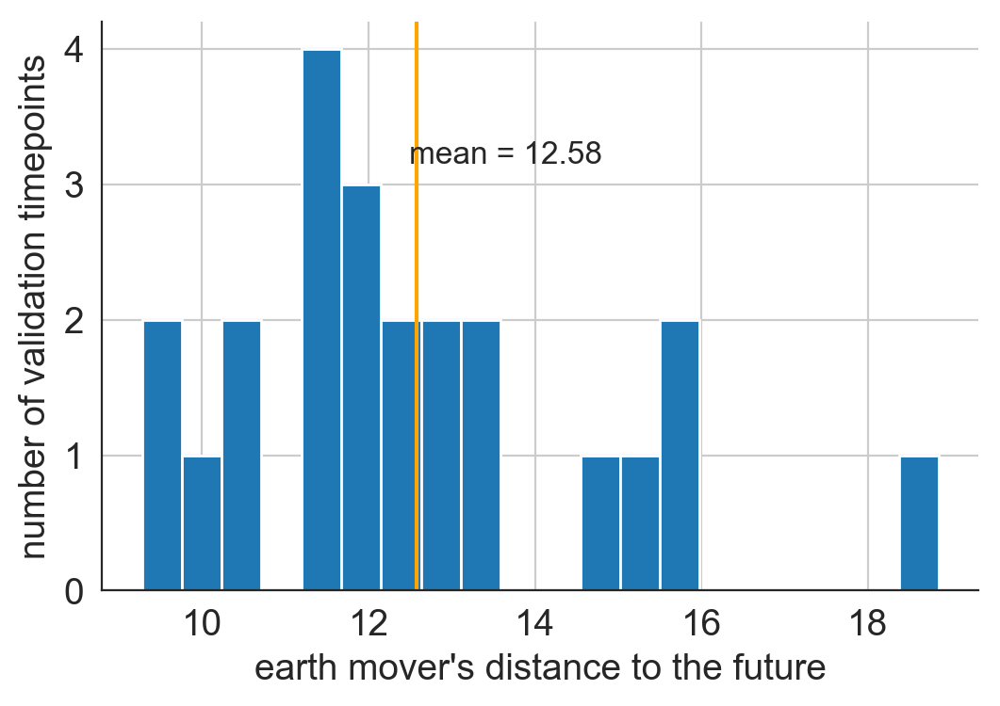

In [94]:
ax = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].hist(bins=20)
ax.set_xlabel("earth mover's distance to the future")
ax.set_ylabel("number of validation timepoints")

mean_y = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].mean()
ax.axvline(
    x=mean_y,
    color="orange"
)

ax.text(
    0.35,
    0.75,
    "mean = %.2f" % (mean_y,),
    transform=ax.transAxes,
    fontsize=12
)


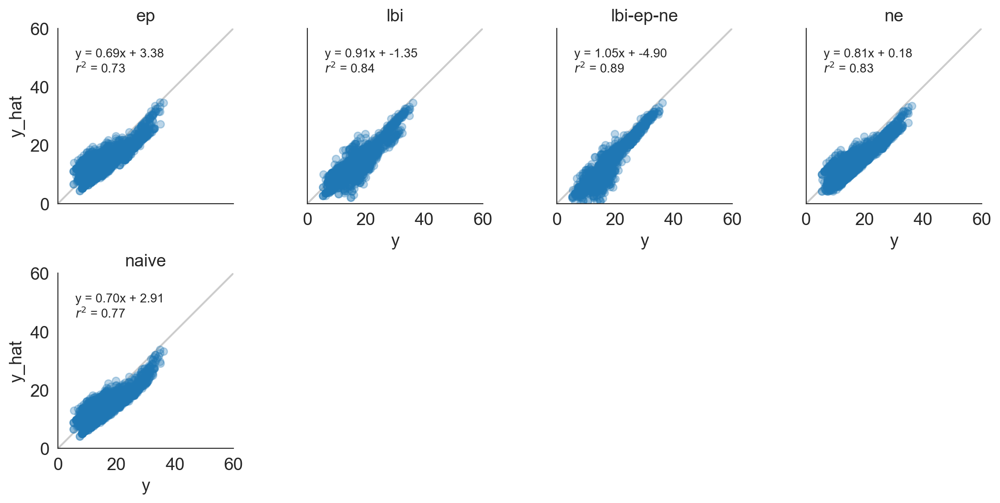

In [189]:
max_y = 60
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(minimal_predictor_names_order)], col="predictors", col_wrap=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)

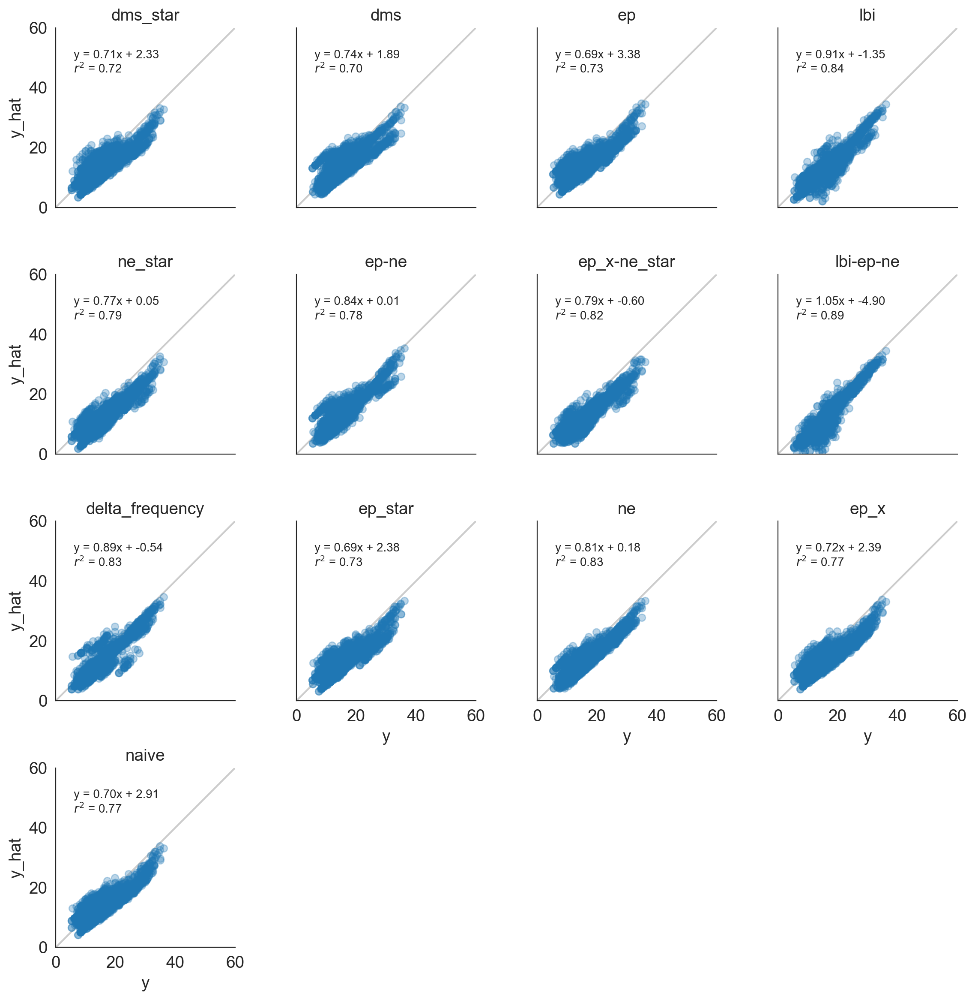

In [97]:
max_y = 60
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df, col="predictors", col_wrap=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)

In [95]:
best_models = predictor_names_order

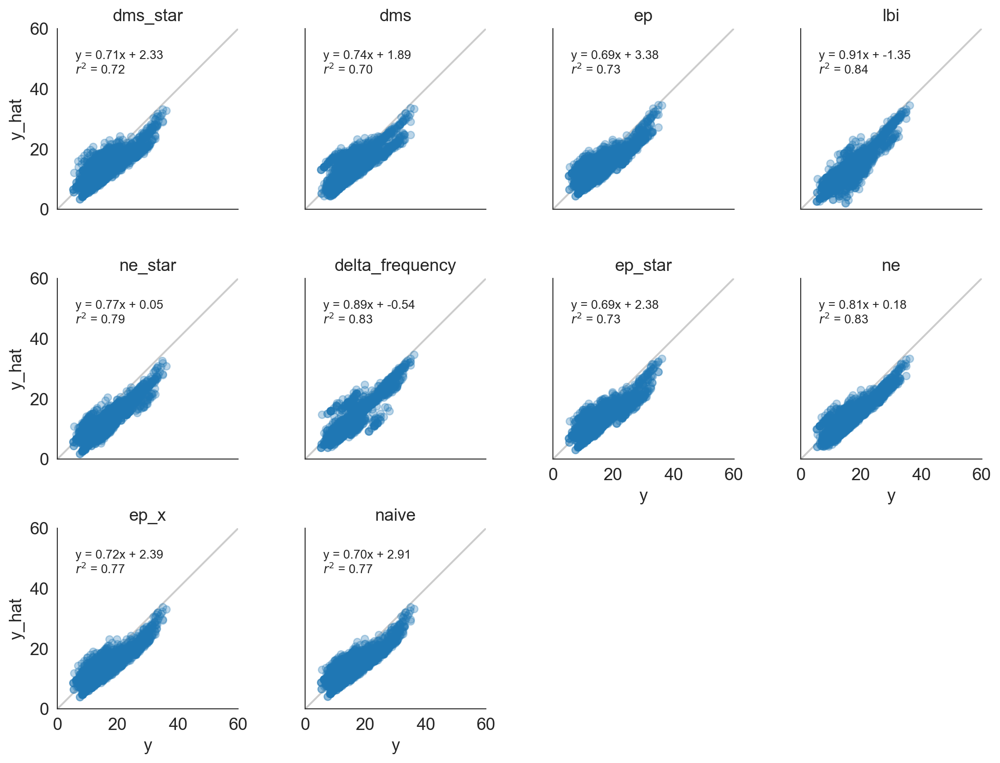

In [96]:
max_y = 60
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(best_models)], col="predictors", col_wrap=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)

In [190]:
frequency_df["year_month"] = frequency_df["validation_timepoint"].dt.strftime("%Y-%m")
frequency_df["year"] = frequency_df["validation_timepoint"].dt.strftime("%Y")

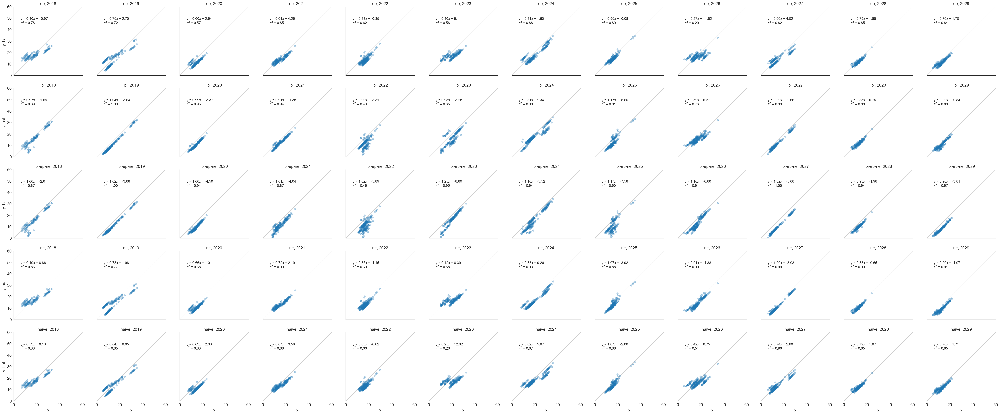

In [191]:
max_y = 60
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(minimal_predictor_names_order)], row="predictors", col="year", height=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{row_name}, {col_name}")

regressions_by_time = []
for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": facet_df["predictors"].unique()[0],
        "timepoint": facet_df["timepoint"].unique()[0],
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=12
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.tight_layout()

In [98]:
regressions_by_time = []
for (predictors, timepoint), group_df in frequency_df.groupby(["predictors", "timepoint"]):
    slope, intercept, r_value, p_value, std_err = linregress(
        group_df["y"],
        group_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": predictors,
        "timepoint": timepoint,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })

regressions_by_time = pd.DataFrame(regressions_by_time)

In [99]:
regressions_by_time.head()

,intercept,p_value,predictors,r_value,slope,timepoint
0,1.651002,1.254626e-83,delta_frequency,0.984595,0.843653,2018-10-01
1,-1.236521,1.184588e-135,delta_frequency,0.999546,0.959356,2019-04-01
2,-4.005775,2.002979e-120,delta_frequency,0.998502,1.054360,2019-10-01
3,-1.951334,2.419467e-40,delta_frequency,0.898177,0.864550,2020-04-01
4,-0.022008,4.991825e-83,delta_frequency,0.984193,0.811616,2020-10-01


In [100]:
naive_regressions_by_time = regressions_by_time[regressions_by_time["predictors"] == "naive"]
non_naive_regressions_by_time = regressions_by_time[regressions_by_time["predictors"] != "naive"]

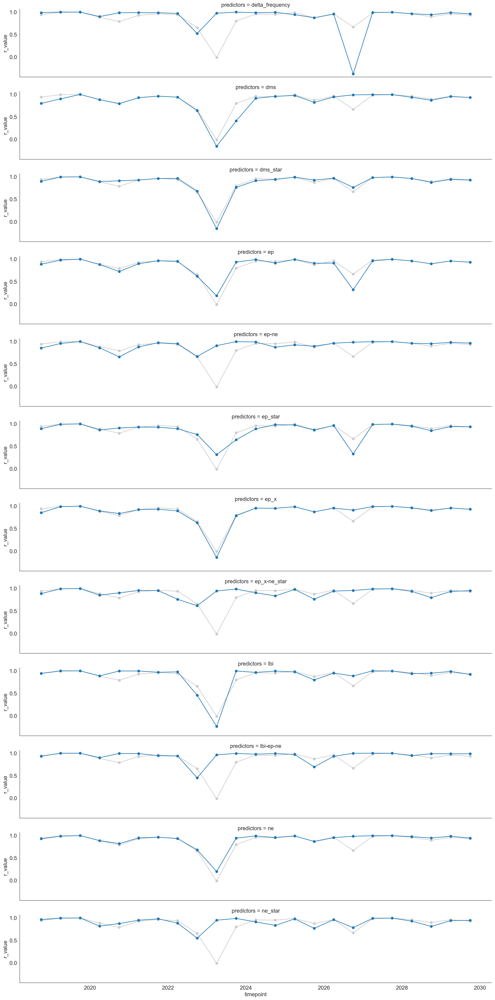

In [101]:
g = sns.FacetGrid(non_naive_regressions_by_time, row="predictors", aspect=6)
g.map(
    plt.plot,
    "timepoint",
    "r_value",
    marker="o"
)

for ax in g.axes.flatten():
    ax.plot(
        naive_regressions_by_time["timepoint"],
        naive_regressions_by_time["r_value"],
        marker="o",
        color="#cccccc",
        zorder=-10
    )

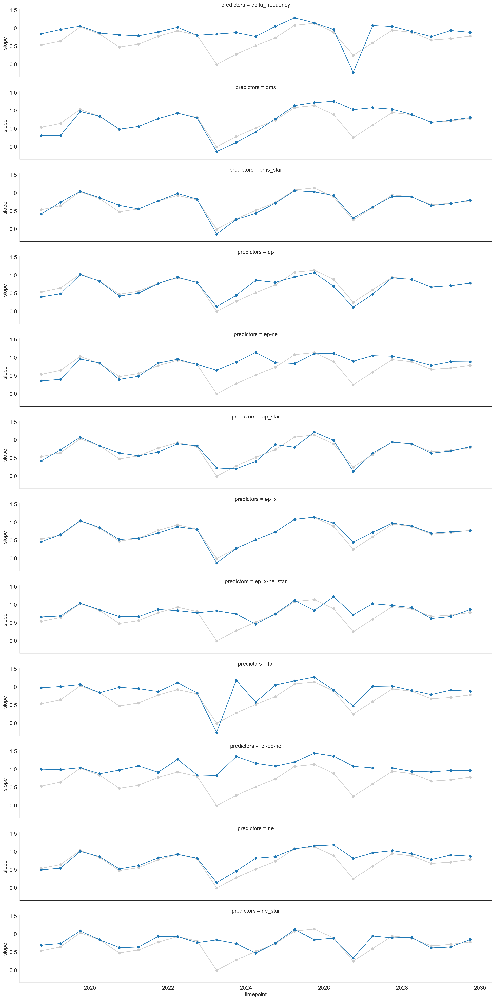

In [102]:
g = sns.FacetGrid(non_naive_regressions_by_time, row="predictors", aspect=6)
g.map(
    plt.plot,
    "timepoint",
    "slope",
    marker="o"
)

for ax in g.axes.flatten():
    ax.plot(
        naive_regressions_by_time["timepoint"],
        naive_regressions_by_time["slope"],
        marker="o",
        color="#cccccc",
        zorder=-10
    )

In [ ]:
"""
max_y = 25
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df, row="predictors", col="year_month", height=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{row_name}, {col_name}")

regressions_by_time = []
for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": facet_df["predictors"].unique()[0],
        "timepoint": facet_df["timepoint"].unique()[0],
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=12
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.tight_layout()"""

## Summarize model forecasting error
[back to top](#Summarize-models)

### Earth mover's distances

Training and validation errors are reported as [earth mover's distances](https://en.wikipedia.org/wiki/Earth_mover%27s_distance). These values minimize the distance between observed and projected frequencies of tips at each timepoint with Hamming distance between amino acid sequences providing the ground distance between each pair of tips in respective timepoints.

In [192]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint
0,dms_star,18.827129,110,2018-10-01
1,dms_star,10.670622,90,2019-04-01
2,dms_star,8.983658,96,2019-10-01
3,dms_star,10.927245,110,2020-04-01
4,dms_star,9.984572,110,2020-10-01


In [193]:
distance_df = errors_by_time_df.groupby("predictors")["validation_error"].aggregate([
    "sum",
    "mean",
    "median"
]).sort_values(by="sum").reset_index()

In [194]:
distance_df

,predictors,sum,mean,median
0,lbi-ep-ne,223.354828,9.711079,9.209394
1,lbi,248.260925,10.793953,10.121273
2,ep_x-ne_star,254.372951,11.059694,10.728332
3,delta_frequency,254.909521,11.083023,10.779117
4,ne_star,258.215343,11.226754,10.888098
5,ne,260.490967,11.325694,11.196552
6,ep-ne,263.958133,11.476441,11.484625
7,dms_star,280.702946,12.204476,11.397263
8,ep_star,283.449703,12.323900,11.671913
9,dms,284.883422,12.386236,11.884995


In [195]:
distance_df.loc[distance_df["predictors"] == "naive", "sum"].values[0]

289.36127853393555

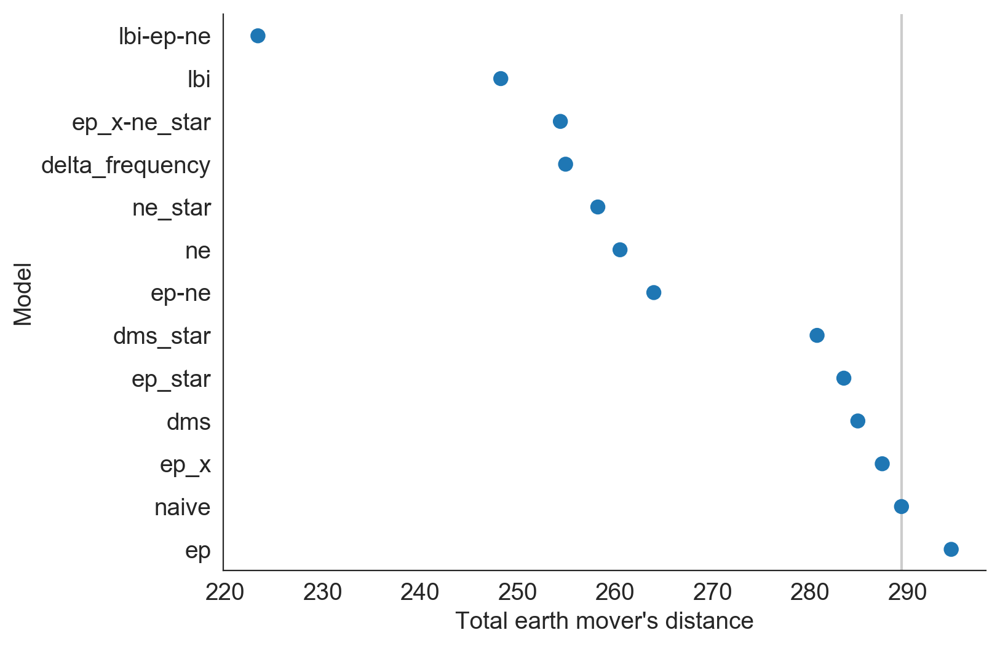

In [196]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="sum",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax
)

ax.set_xlabel("Total earth mover's distance")
ax.set_ylabel("Model")
ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "sum"].values[0],
    color="#cccccc",
    zorder=-10
)

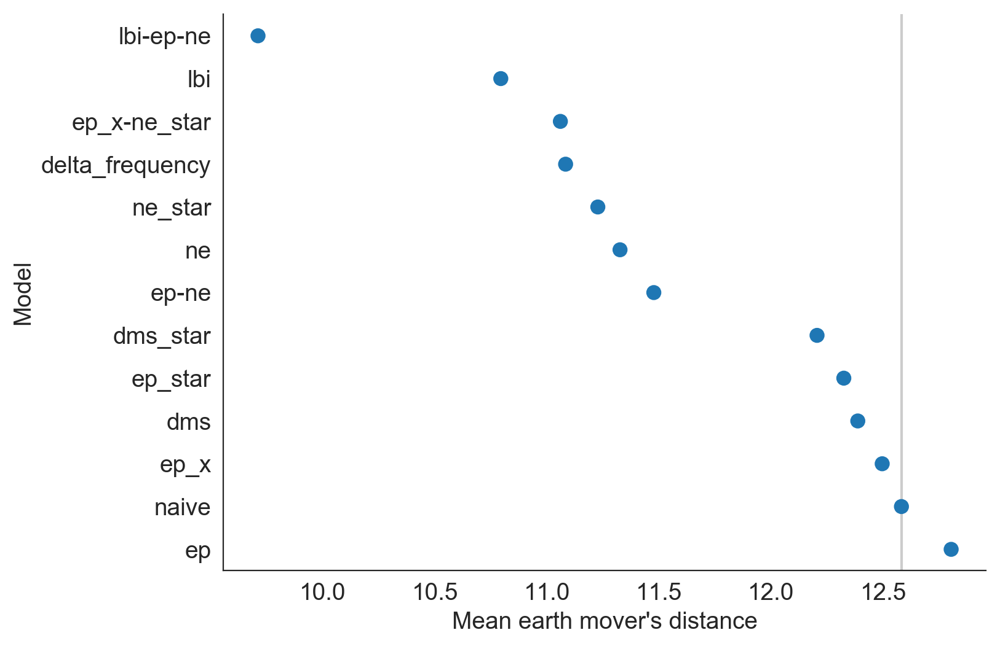

In [197]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="mean",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax
)

ax.set_xlabel("Mean earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "mean"].values[0],
    color="#cccccc",
    zorder=-10
)

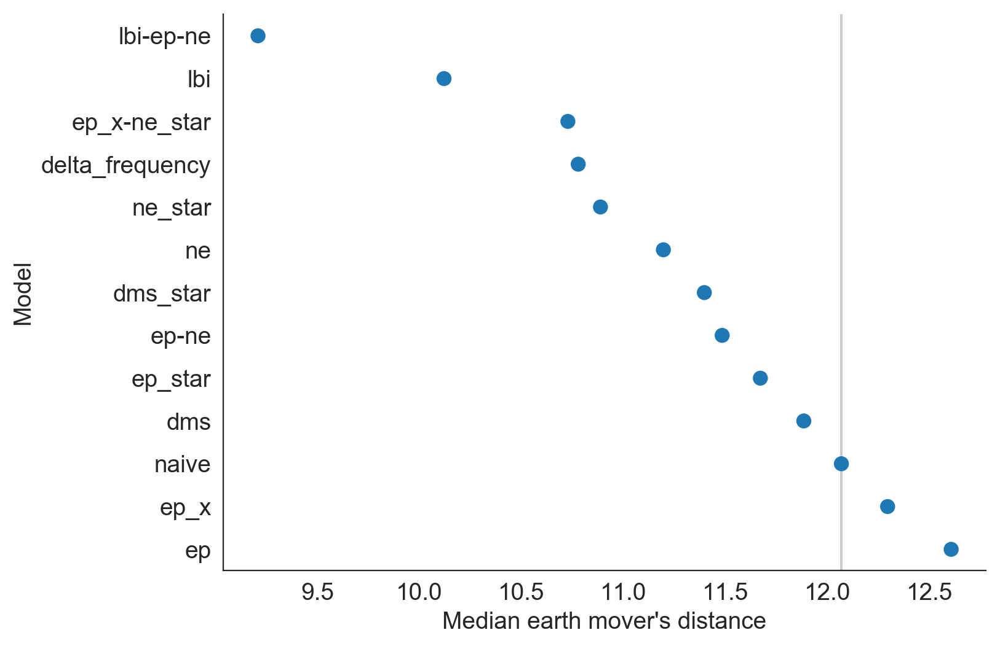

In [198]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="median",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax,
    order=distance_df.sort_values("median").loc[:, "predictors"]
)

ax.set_xlabel("Median earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "median"].values[0],
    color="#cccccc",
    zorder=-10
)

In [199]:
predictor_type_order = predictor_names_order
predictor_names = predictor_names_order

In [200]:
predictor_name_by_id = dict(zip(predictor_type_order, predictor_names))

In [201]:
predictor_name_by_id

{'naive': 'naive',
 'ep': 'ep',
 'ep_star': 'ep_star',
 'ep_x': 'ep_x',
 'ne': 'ne',
 'ne_star': 'ne_star',
 'lbi': 'lbi',
 'dms': 'dms',
 'dms_star': 'dms_star',
 'delta_frequency': 'delta_frequency'}

In [202]:
errors_by_time_df["predictors_name"] = errors_by_time_df["predictors"].map(predictor_name_by_id)

In [203]:
errors_by_time_df[errors_by_time_df["predictors"] == "naive"]

,predictors,validation_error,validation_n,validation_timepoint,predictors_name
276,naive,15.821960,110,2018-10-01,naive
277,naive,12.441986,90,2019-04-01,naive
278,naive,9.277407,96,2019-10-01,naive
279,naive,11.684387,110,2020-04-01,naive
280,naive,12.069133,110,2020-10-01,naive
281,naive,12.901653,90,2021-04-01,naive
282,naive,11.621456,97,2021-10-01,naive
283,naive,12.037824,110,2022-04-01,naive
284,naive,13.004804,110,2022-10-01,naive
285,naive,15.070159,90,2023-04-01,naive


In [204]:
predictor_type_order

['naive',
 'ep',
 'ep_star',
 'ep_x',
 'ne',
 'ne_star',
 'lbi',
 'dms',
 'dms_star',
 'delta_frequency']

In [205]:
individual_median_errors = []
for predictor in predictor_type_order:
    individual_median_errors.append(
        distance_df.loc[distance_df["predictors"] == predictor, "median"].values[0]
    )

In [206]:
median_error = errors_by_time_df.groupby("predictors")["validation_error"].median().reset_index().sort_values(by="validation_error")
median_error_order = median_error["predictors"].values

In [207]:
#median_error_order = [predictor for predictor in median_error_order if "-" not in predictor]

(0, 20.546274283499084)

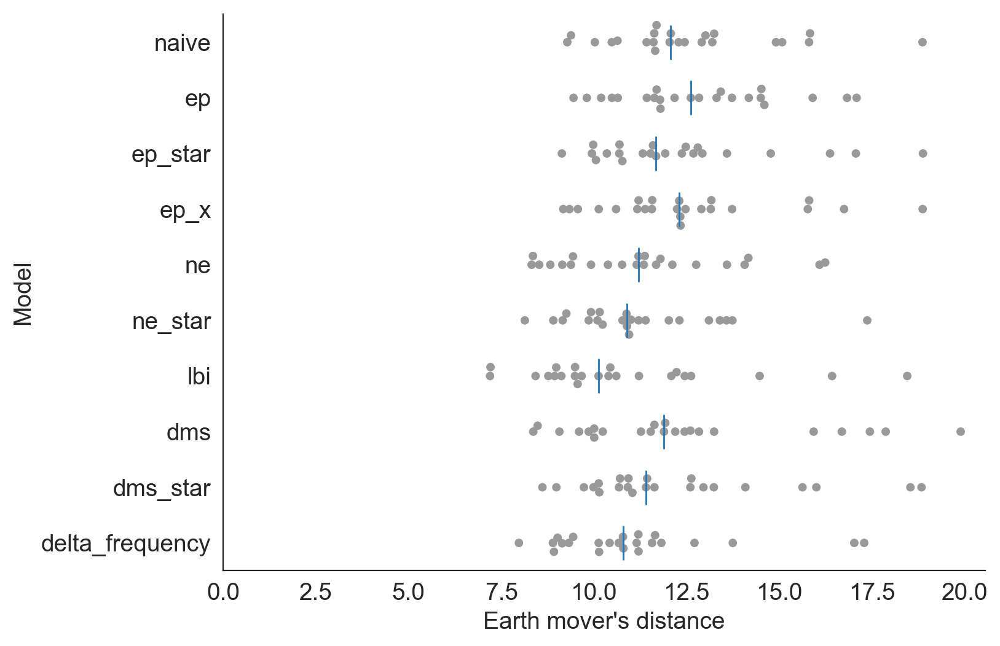

In [120]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

ax.plot(
    individual_median_errors,
    predictor_type_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax = sns.swarmplot(
    x="validation_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=predictor_type_order,
    color="#999999",
    zorder=-10
)

ax.set_yticklabels(predictor_names)

ax.set_xlabel("Earth mover's distance")
ax.set_ylabel("Model")
ax.set_xlim(left=0)

Text(0,0.5,'Model')

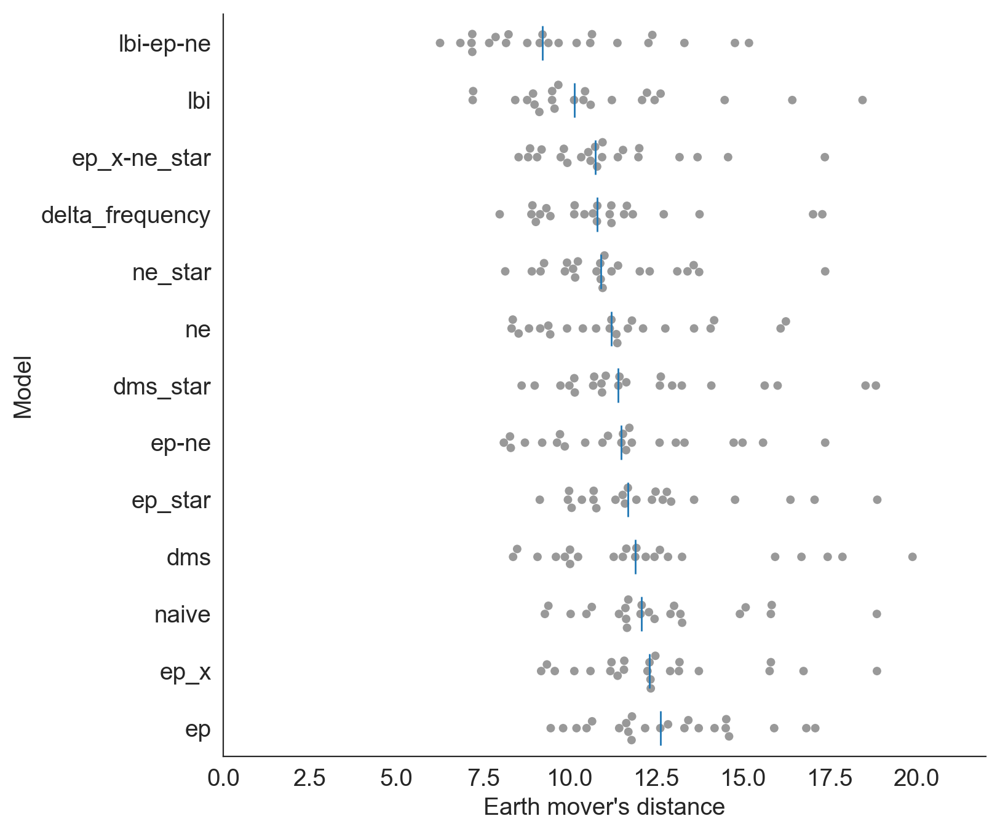

In [121]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(0, 22)

ax = sns.swarmplot(
    x="validation_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_error_order,
    color="#999999",
    zorder=-10
)

ax.plot(
    median_error["validation_error"],
    median_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax.set_xlabel("Earth mover's distance")
ax.set_ylabel("Model")

In [122]:
errors_by_time_df.sort_values(by=["predictors", "validation_timepoint"], ascending=False).head()

,predictors,validation_error,validation_n,validation_timepoint,predictors_name
114,ne_star,9.153485,95,2029-10-01,ne_star
113,ne_star,10.874861,90,2029-04-01,ne_star
112,ne_star,10.995991,110,2028-10-01,ne_star
111,ne_star,10.230055,110,2028-04-01,ne_star
110,ne_star,9.915998,93,2027-10-01,ne_star


In [123]:
errors_by_time_df[errors_by_time_df["predictors"].str.contains("-")]["predictors"].unique()

array(['ep-ne', 'ep_x-ne_star', 'lbi-ep-ne'], dtype=object)

In [ ]:
composite_predictors_order = [
    "lbi",
    "delta_frequency",
    "cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-cTiterSub_x",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

In [ ]:
composite_predictor_names = [
    "LBI",
    "delta frequency",
    "HI cross.",
    "LBI, delta frequency",
    "LBI, HI cross.",
    "LBI, DMS, HI cross.",
    "Luksza and Lassig"
]

In [ ]:
distance_df.head()

In [ ]:
"lbi" in distance_df["predictors"].values

In [ ]:
median_errors = []
for predictor in composite_predictors_order:
    if predictor in distance_df["predictors"].values:
        median_errors.append(distance_df.loc[distance_df["predictors"] == predictor, "median"].values[0])

In [ ]:
composite_predictors_order = [
    "lbi",
    "delta_frequency",
    "cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-cTiterSub_x",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

composite_predictor_names = [
    "LBI",
    "delta frequency",
    "HI phenotypes",
    "LBI, delta frequency",
    "LBI, HI phenotypes",
    "LBI, DMS, HI phenotypes",
    "Luksza and Lassig"
]

In [ ]:
median_errors

In [ ]:
if len(median_errors) > 0:
    fig, ax = plt.subplots(1, 1, figsize=(8, 4))

    ax.set_xlim(0, 22)
    ax = sns.swarmplot(
        x="validation_error",
        y="predictors",
        data=errors_by_time_df,
        ax=ax,
        color="#999999",
        order=composite_predictors_order
    )

    ax.plot(
        median_errors,
        composite_predictors_order,
        marker="|",
        markersize=20,
        linestyle="",
        zorder=10
    )

    ax.set_yticklabels(composite_predictor_names)

    #labels = ax.get_yticklabels()
    #output = plt.setp(labels, rotation=30)

    ax.set_xlabel("Earth mover's distance")
    ax.set_ylabel("Model")
    ax.axvline(x=0.0, color="#cccccc", zorder=-20, alpha=0.25)

    plt.tight_layout()

In [138]:
errors_by_time_df.loc[pd.isnull(errors_by_time_df["predictors_name"]), "predictors_name"] = errors_by_time_df.loc[
    pd.isnull(errors_by_time_df["predictors_name"]), "predictors"
]

In [ ]:
g = facet_time_plot(
    errors_by_time_df,
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    col_wrap=2,
    markersize=7
)

In [ ]:
predictor_type_order

In [ ]:
antigenic_predictors = predictor_type_order[1:5]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(antigenic_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in antigenic_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)

In [ ]:
predictor_type_order

In [ ]:
functional_predictors = predictor_type_order[5:7]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(functional_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in functional_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)


In [ ]:
growth_predictors = predictor_type_order[7:]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(growth_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in growth_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)

In [ ]:
errors_by_time_df["predictors"].unique()

In [ ]:
errors_by_time_df[errors_by_time_df["predictors"] == "naive"]

In [ ]:
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"] == "naive"],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    height=6,
    aspect=1
)
#g.set_titles("{col_name}")
#g.fig.subplots_adjust(hspace=0.2)

In [ ]:
errors_by_time_df.head()

### Adjusted earth mover's distance (relative to naive model)

In [208]:
naive_error = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].values
for predictor in errors_by_time_df["predictors"].drop_duplicates().values:
    errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"] = errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "validation_error"] - naive_error

In [209]:
naive_error

array([15.82196045, 12.44198608,  9.27740669, 11.68438721, 12.0691328 ,
       12.90165329, 11.62145615, 12.03782368, 13.00480366, 15.07015896,
       15.79662132, 18.85429001, 13.18792725,  9.37858772, 11.64729786,
       12.27931404, 14.90385723, 13.23704243, 10.02086544, 10.47650528,
       11.60084343, 11.41617966, 10.6311779 ])

In [210]:
median_adjusted_error = errors_by_time_df.groupby("predictors")["adjusted_error"].median().reset_index().sort_values(by="adjusted_error")
median_adjusted_error_order = median_adjusted_error["predictors"].values

In [211]:
errors_by_time_df["adjusted_error"].min()

-7.720335483551025

In [212]:
errors_by_time_df["adjusted_error"].max()

4.237384796142578

In [213]:
median_adjusted_error_order

array(['lbi-ep-ne', 'delta_frequency', 'ep_x-ne_star', 'ne_star', 'lbi',
       'ne', 'ep-ne', 'dms_star', 'ep_star', 'ep_x', 'naive', 'dms', 'ep'],
      dtype=object)

In [214]:
median_adjusted_error.head()

,predictors,adjusted_error
9,lbi-ep-ne,-3.688773
0,delta_frequency,-1.496890
7,ep_x-ne_star,-1.170567
12,ne_star,-1.143592
8,lbi,-1.074660


In [215]:
minimal_median_adjusted_error_order = [
    predictor for predictor in median_adjusted_error_order
    if predictor in minimal_predictor_names_order
]

Text(0,0.5,'Model')

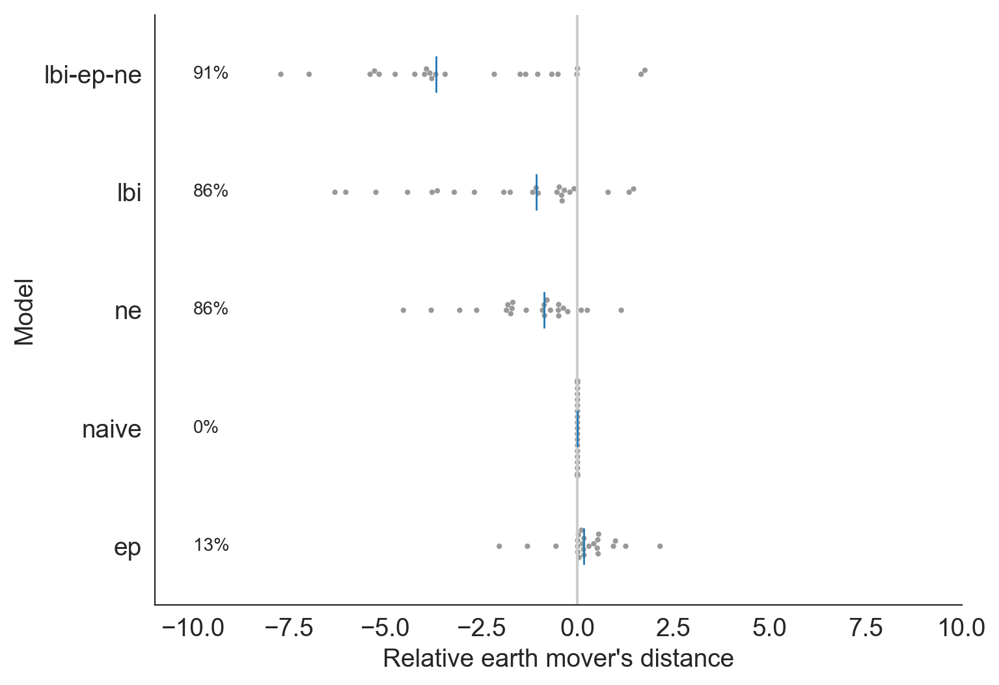

In [217]:
# Only show adjusted error for minimal set of models
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

ax.set_xlim(-11, 10)

ax = sns.swarmplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df[errors_by_time_df["predictors"].isin(minimal_predictor_names_order)],
    ax=ax,
    order=minimal_median_adjusted_error_order,
    color="#999999",
    zorder=-10,
    size=3
)

ax.plot(
    median_adjusted_error.loc[median_adjusted_error["predictors"].isin(minimal_predictor_names_order), "adjusted_error"],
    minimal_median_adjusted_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)


#ax.text(0.5, 0, "test")
for i, predictor in enumerate(minimal_median_adjusted_error_order):
    predictor_errors = errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"]
    
    ax.text(
        -10,
        i,
        "%i%%" % (((predictor_errors < 0).sum() / float(predictor_errors.shape[0])) * 100),
        horizontalalignment='left',
        verticalalignment='center',
        fontsize=10
    )

ax.axvline(x=0, color="#cccccc", zorder=-10)

ax.set_xlabel("Relative earth mover's distance")
ax.set_ylabel("Model")

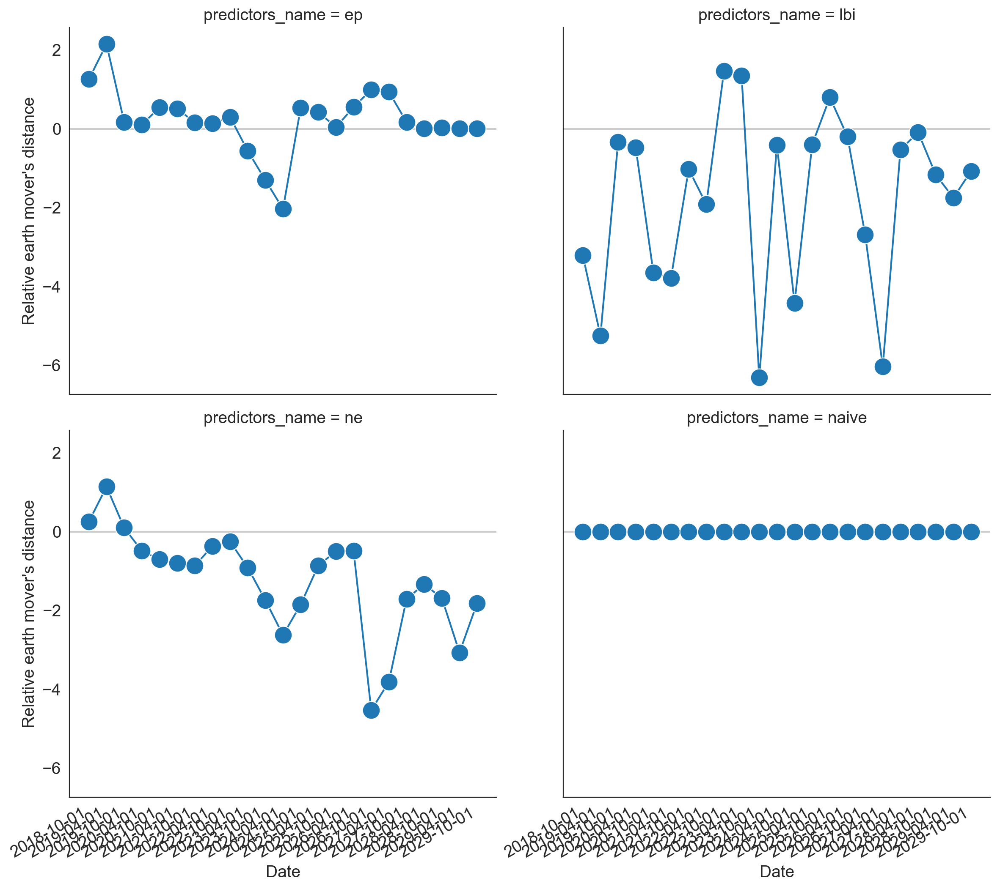

In [220]:
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(minimal_predictor_names_order)],
    "adjusted_error",
    "Relative earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    height=6,
    aspect=1,
    col_wrap=2
)
#g.set_titles("{col_name}")
#g.fig.subplots_adjust(hspace=0.2)

Text(0,0.5,'Model')

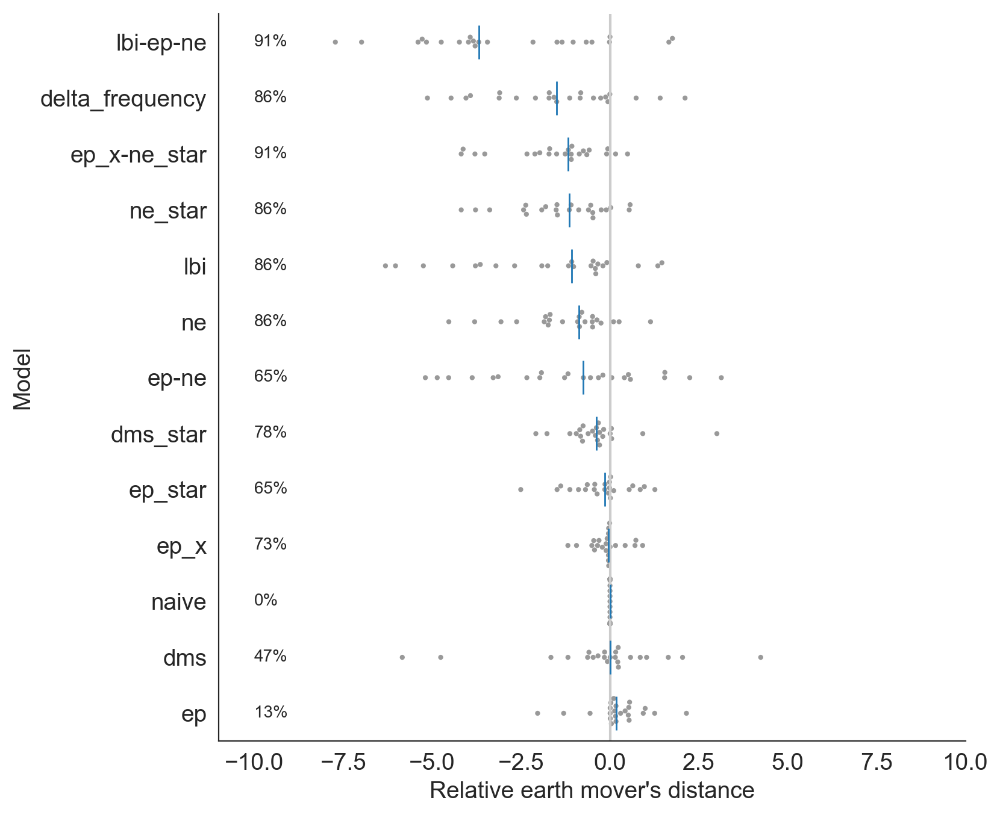

In [218]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(-11, 10)

ax = sns.swarmplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10,
    size=3
)

ax.plot(
    median_adjusted_error["adjusted_error"],
    median_adjusted_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)


#ax.text(0.5, 0, "test")
for i, predictor in enumerate(median_adjusted_error_order):
    predictor_errors = errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"]
    
    ax.text(
        -10,
        i,
        "%i%%" % (((predictor_errors < 0).sum() / float(predictor_errors.shape[0])) * 100),
        horizontalalignment='left',
        verticalalignment='center',
        fontsize=10
    )

ax.axvline(x=0, color="#cccccc", zorder=-10)

ax.set_xlabel("Relative earth mover's distance")
ax.set_ylabel("Model")

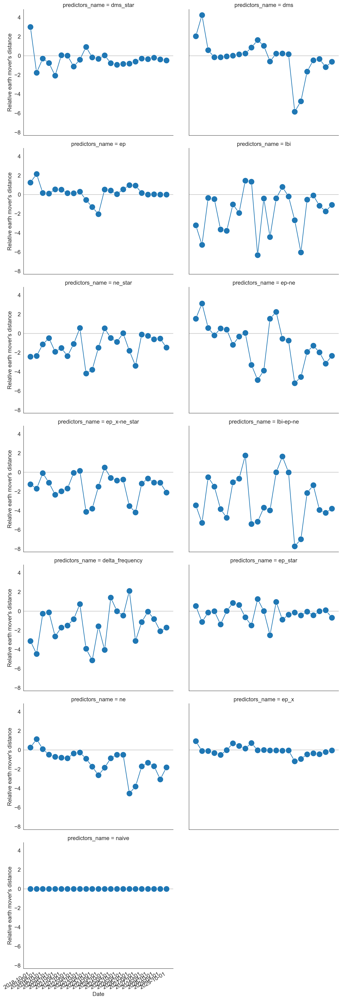

In [139]:
g = facet_time_plot(
    errors_by_time_df,
    "adjusted_error",
    "Relative earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    height=6,
    aspect=1,
    col_wrap=2
)
#g.set_titles("{col_name}")
#g.fig.subplots_adjust(hspace=0.2)

In [133]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint,predictors_name,adjusted_error
0,dms_star,18.827129,110,2018-10-01,dms_star,3.005169
1,dms_star,10.670622,90,2019-04-01,dms_star,-1.771364
2,dms_star,8.983658,96,2019-10-01,dms_star,-0.293749
3,dms_star,10.927245,110,2020-04-01,dms_star,-0.757142
4,dms_star,9.984572,110,2020-10-01,dms_star,-2.084560


In [134]:
coefficients_by_time_df.head()

,coefficient,predictor,predictors,validation_timepoint
0,1.586394,dms_star,dms_star,2018-10-01
1,1.437840,dms_star,dms_star,2019-04-01
2,1.239938,dms_star,dms_star,2019-10-01
3,1.235715,dms_star,dms_star,2020-04-01
4,1.258991,dms_star,dms_star,2020-10-01


In [135]:
errors_and_coefficients_by_time = coefficients_by_time_df.merge(
    errors_by_time_df,
    on=["predictors", "validation_timepoint"]
)

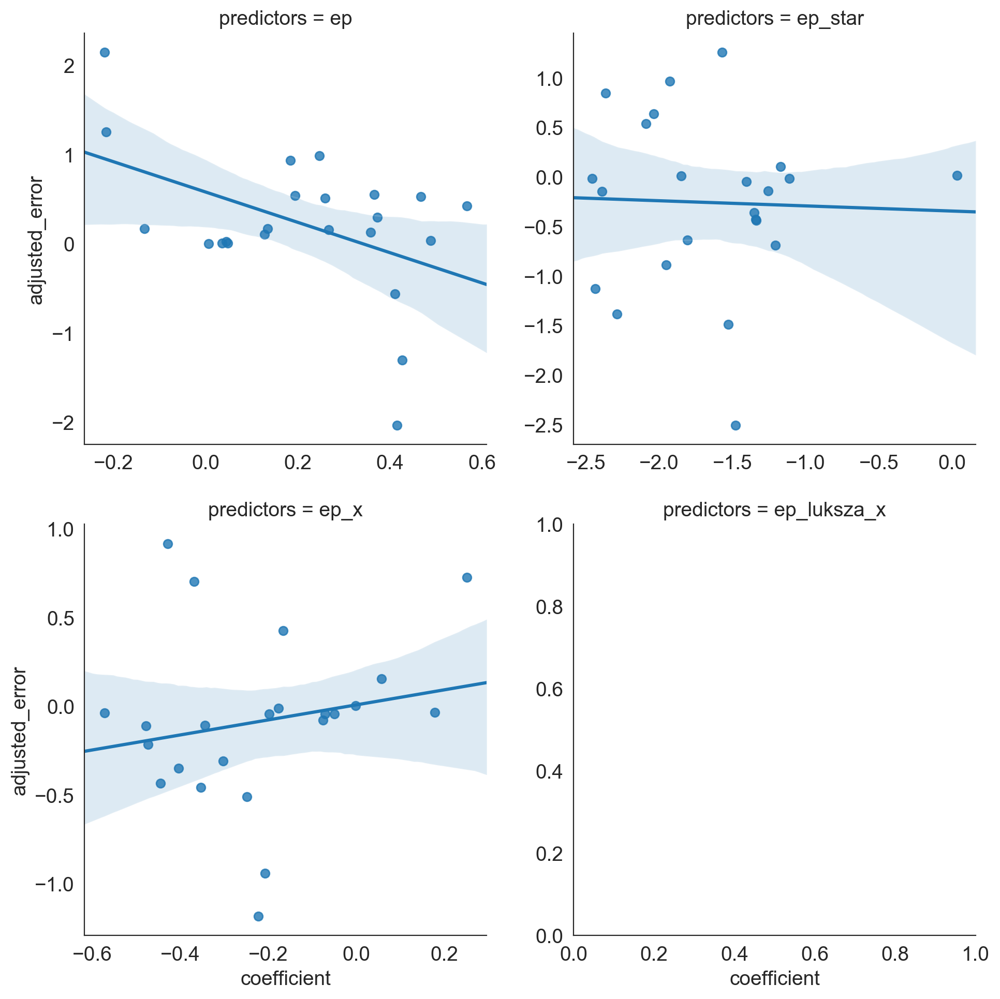

In [136]:
sns.lmplot(
    "coefficient",
    "adjusted_error",
    errors_and_coefficients_by_time,
    col="predictors",
    col_wrap=2,
    sharex=False,
    sharey=False,
    col_order=["ep", "ep_star", "ep_x", "ep_luksza_x"]
)

In [ ]:
predictor_errors.shape[0]

Text(0,0.5,'Model')

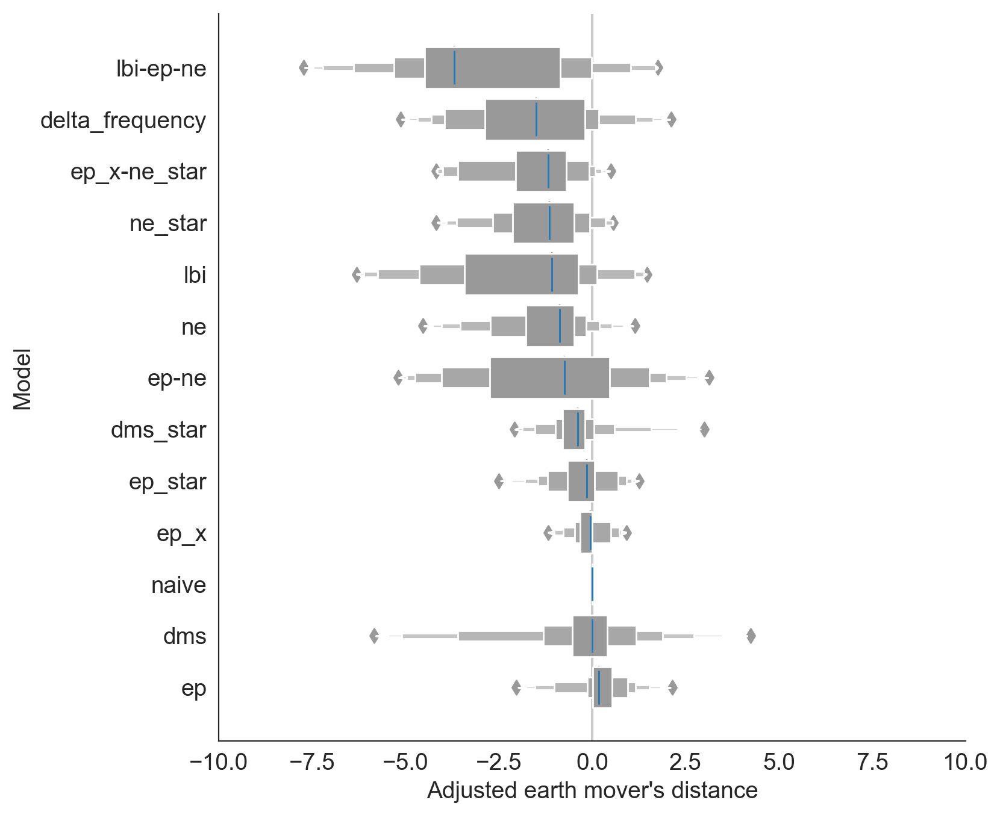

In [137]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(-10, 10)

"""
ax = sns.swarmplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10
)
"""

ax = sns.boxenplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10
)

ax.plot(
    median_adjusted_error["adjusted_error"],
    median_adjusted_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax.axvline(x=0, color="#cccccc", zorder=-10)

ax.set_xlabel("Adjusted earth mover's distance")
ax.set_ylabel("Model")

In [ ]:
errors_by_time_df.head()

In [ ]:
errors_by_time_df.groupby("predictors")["adjusted_error"].median()

In [ ]:
g = facet_time_plot(errors_by_time_df, "adjusted_error", "Relative earth mover's distance", timepoint_column="validation_timepoint",
                    col_wrap=2, markersize=7)
g.set_titles("{col_name}")

In [ ]:
best_models = [
    "lbi-dms_star-cTiterSub_x",
    "lbi-delta_frequency",
    "lbi",
    "lbi-ep_x-ne_star"
]

g = facet_time_plot(errors_by_time_df[errors_by_time_df["predictors"].isin(best_models)],
                    "adjusted_error", "Relative earth mover's distance", timepoint_column="validation_timepoint",
                    col_wrap=4, markersize=7)
g.set_titles("{col_name}")

## Summarize model coefficients

In [234]:
overall_coefficients_df

,mean,predictor,predictors,std
0,0.942687,dms_star,dms_star,0.359393
1,0.728348,dms,dms,0.946503
2,0.210966,ep,ep,0.218885
3,1.192926,lbi,lbi,0.138666
4,-3.238779,ne_star,ne_star,0.915635
5,0.092149,ep,ep-ne,0.519336
6,-0.987169,ne,ep-ne,0.610004
7,-0.355950,ep_x,ep_x-ne_star,0.257652
8,-3.482653,ne_star,ep_x-ne_star,0.819012
9,1.902171,lbi,lbi-ep-ne,1.220610


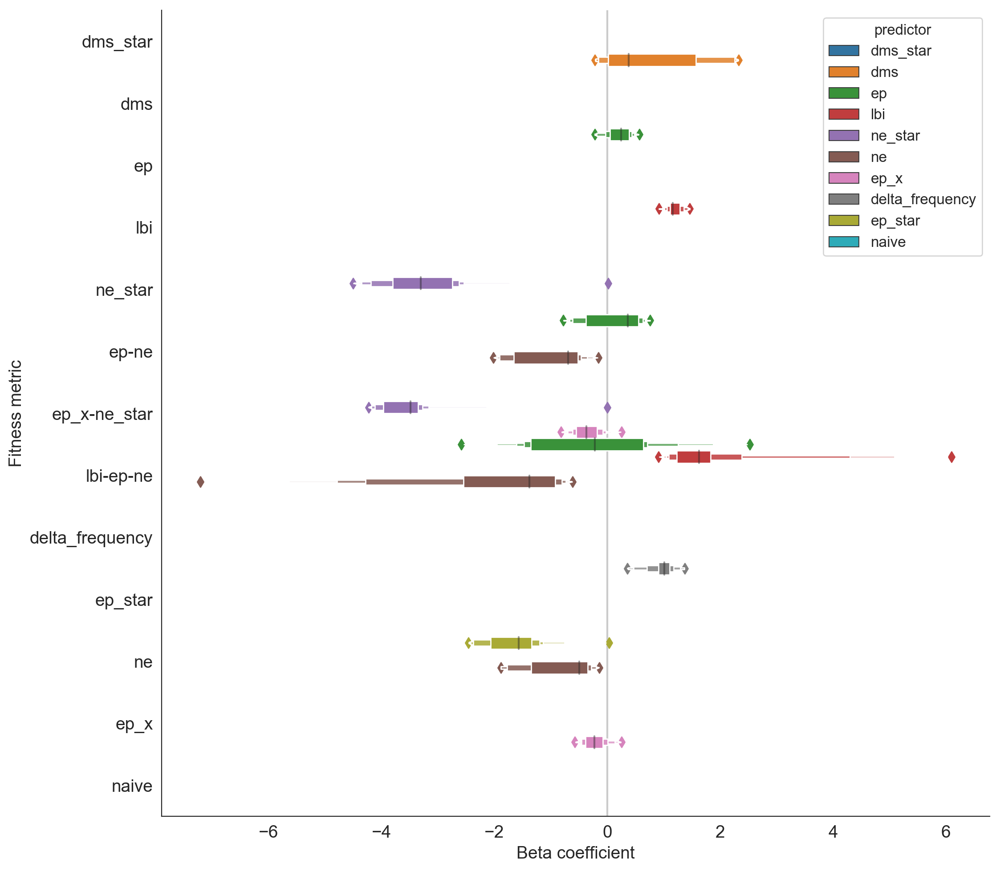

In [223]:
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

#ax.set_xlim(-20, 20)
sns.boxenplot(
    y="predictors",
    x="coefficient",
    hue="predictor",
    data=coefficients_by_time_df,
    width=2.0,
    ax=ax,
#    order=predictor_names_order
)

ax.axvline(0, color="#999999", alpha=0.5, zorder=-10)
ax.set_xlabel("Beta coefficient")
ax.set_ylabel("Fitness metric")

sns.despine()

In [224]:
coefficients_by_time_df["predictors_name"] = coefficients_by_time_df["predictors"].map(predictor_name_by_id)

In [225]:
coefficients_by_time_df.loc[pd.isnull(coefficients_by_time_df["predictors_name"]), "predictors_name"] = coefficients_by_time_df.loc[
    pd.isnull(coefficients_by_time_df["predictors_name"]), "predictors"
]

In [226]:
coefficients_by_time_df["predictors_name"].unique().shape

(13,)

In [227]:
best_models

['naive',
 'ep',
 'ep_star',
 'ep_x',
 'ne',
 'ne_star',
 'lbi',
 'dms',
 'dms_star',
 'delta_frequency']

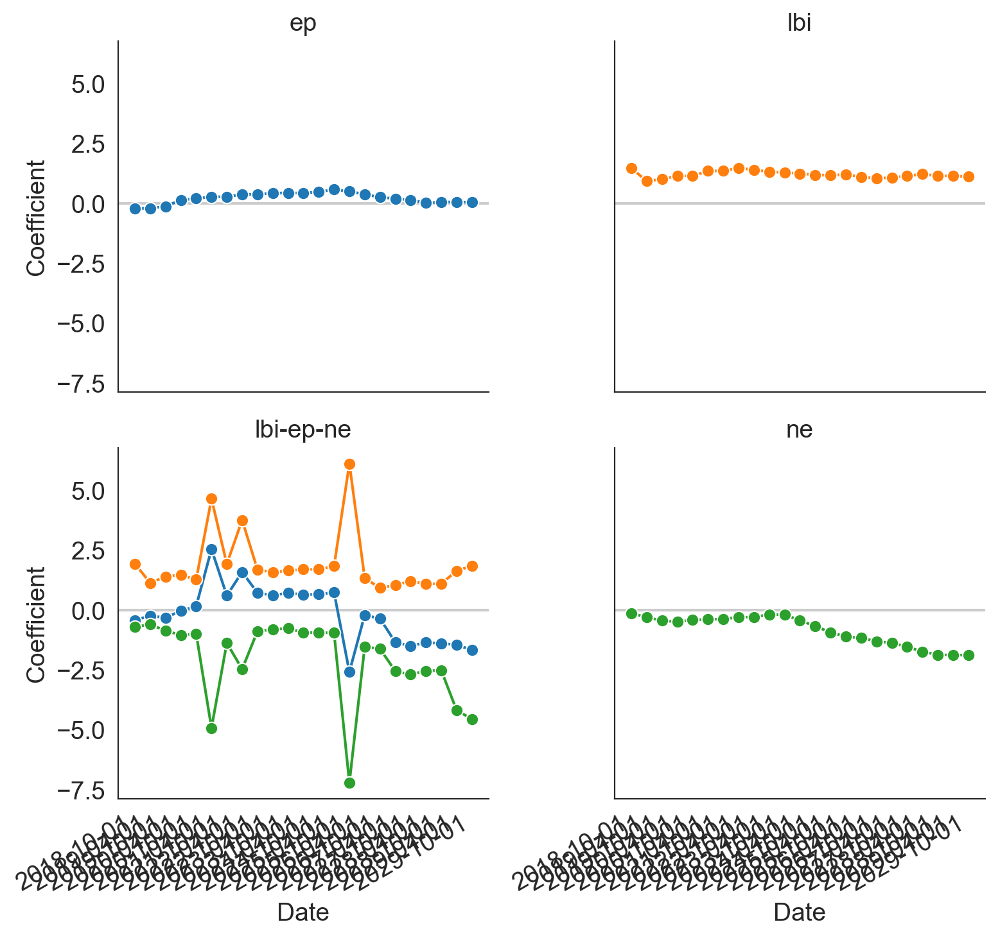

In [232]:
g = facet_time_plot(
    coefficients_by_time_df[(coefficients_by_time_df["predictors"].isin(minimal_predictor_names_order)) &
                            (coefficients_by_time_df["predictors"] != "naive")],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    hue="predictor",
    markersize=7,
    col_wrap=2
)
g.set_titles("{col_name}")

#for ax in g.axes.flatten():
#    ax.set_ylim(-11, 11)

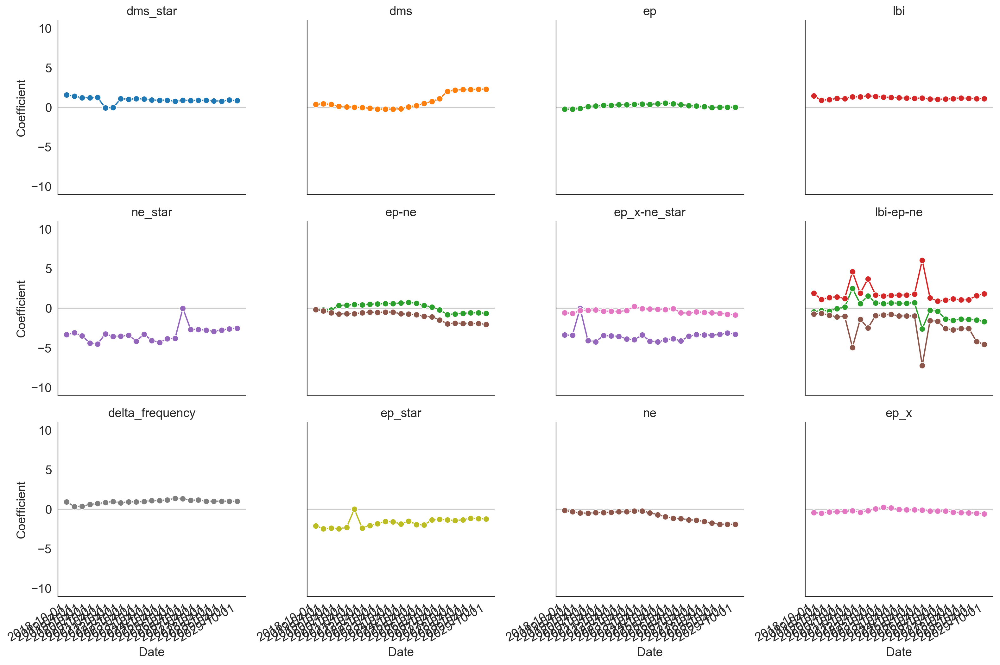

In [229]:
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"] != "naive"],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    hue="predictor",
    markersize=7
)
g.set_titles("{col_name}")

for ax in g.axes.flatten():
    ax.set_ylim(-11, 11)

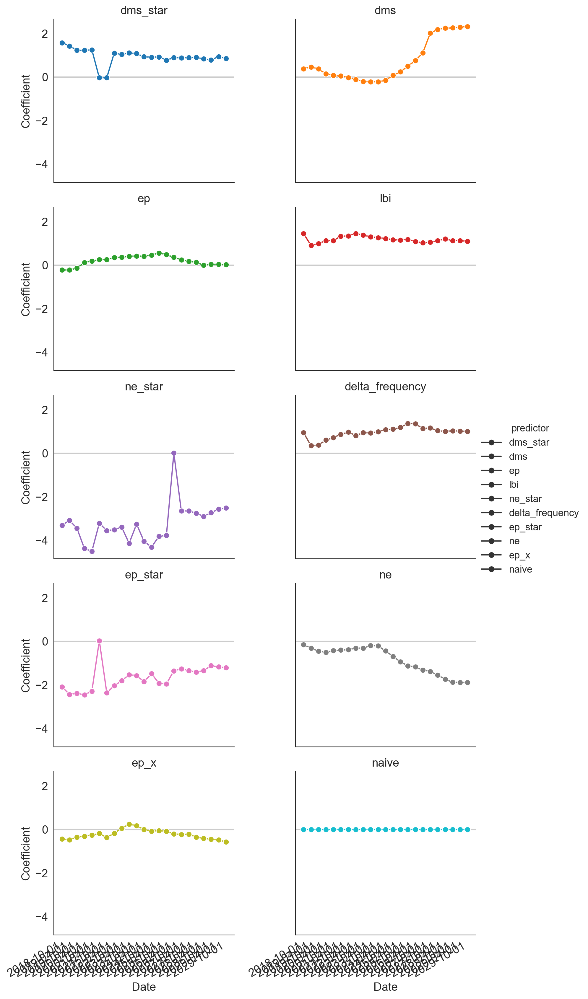

In [228]:
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(best_models)],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    hue="predictor",
    col_wrap=2,
    markersize=7
)
g.set_titles("{col_name}")
g.add_legend()

In [ ]:
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"] != "naive"],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_order=[predictor_name_by_id[predictor] for predictor in predictor_type_order[1:]],
    hue="predictor",
    markersize=7
)
g.set_titles("{col_name}")

for ax in g.axes.flatten():
    ax.set_ylim(-11, 11)

In [233]:
print(coefficients_by_time_df.loc[coefficients_by_time_df["predictors"] == "lbi", ["validation_timepoint", "coefficient"]])

   validation_timepoint  coefficient
69           2018-10-01     1.459559
70           2019-04-01     0.917714
71           2019-10-01     0.994111
72           2020-04-01     1.136660
73           2020-10-01     1.133837
74           2021-04-01     1.340500
75           2021-10-01     1.346892
76           2022-04-01     1.464459
77           2022-10-01     1.387343
78           2023-04-01     1.309282
79           2023-10-01     1.272048
80           2024-04-01     1.232558
81           2024-10-01     1.177807
82           2025-04-01     1.161634
83           2025-10-01     1.192551
84           2026-04-01     1.093727
85           2026-10-01     1.037237
86           2027-04-01     1.062006
87           2027-10-01     1.132580
88           2028-04-01     1.209044
89           2028-10-01     1.138096
90           2029-04-01     1.135090
91           2029-10-01     1.102562


In [ ]:
print(coefficients_by_time_df.loc[coefficients_by_time_df["predictors"] == "ne_star", ["validation_timepoint", "coefficient"]])

In [ ]:
composite_predictors_order

In [ ]:
lbi_dfreq_order = ["lbi", "delta_frequency", "lbi-delta_frequency"]
lbi_dfreq_names = ["LBI", "delta frequency", "LBI, delta frequency"]
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(lbi_dfreq_order)],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    hue="predictor",
    col_order=lbi_dfreq_order,
    markersize=7
)

#g.set_titles("{col_name}")

for ci, ax in enumerate(g.axes.flatten()):
    ax.set_title(lbi_dfreq_names[ci], fontsize=12)
    #ax.set_ylim(-2., 2.)

In [ ]:
lbi_dfreq_order = ["lbi", "cTiterSub_x", "lbi-cTiterSub_x"]
lbi_dfreq_names = ["LBI", "HI cross-immunity", "LBI, HI cross-immunity"]
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(lbi_dfreq_order)],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    hue="predictor",
    col_order=lbi_dfreq_order,
    markersize=7
)

#g.set_titles("{col_name}")

for ci, ax in enumerate(g.axes.flatten()):
    ax.set_title(lbi_dfreq_names[ci], fontsize=12)
    #ax.set_ylim(-2., 2.)